# Environment setup

### Library preparation

In [8]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [1]:
import time, os, io, clipboard
from PIL import ImageGrab
from IPython.display import Image, display
from scipy import stats

from math import *
from tqdm import tqdm, tqdm_notebook

from io import StringIO 
import pandas as pd
import numpy as np
import scipy.constants as const
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
plt.close('all')






import qcodes as qc
from qcodes import Station, load_by_run_spec, load_by_guid
from qcodes.instrument.base import Instrument
from qcodes.dataset.experiment_container import (Experiment,
                                                 load_last_experiment,
                                                 new_experiment, experiments)
from qcodes.dataset.database import initialise_database
from qcodes.dataset.measurements import Measurement
from qcodes.dataset.plotting import plot_by_id, get_data_by_id, plot_dataset
from qcodes.dataset.data_set import load_by_id
# from qcodes.dataset.data_export import get_shaped_data_by_runidb

D:\anaconda\lib\site-packages\qcodes\dataset\database.py:13: UserWarning: The module `qcodes.dataset.database` is deprecated.
Public features are available at the import of `qcodes`.
Private features are available in `qcodes.dataset.sqlite.*` modules.
  warnings.warn('The module `qcodes.dataset.database` is deprecated.\n'


In [2]:
import sys 
sys.path.append('..\_jjtools')

from Exps import *
from JJ_data_processing import *
from JJformulas import *
from meas_util import *

from si_prefix import si_format as SI

D:\anaconda\lib\site-packages\tqdm\autonotebook\__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Database ini

In [3]:
SAMPLE = '59BBN1'
qc.config["core"]["db_location"] = r'\\JOSH-PC\OurData_OneDrive\Experiments_{}.db'.format(SAMPLE)

In [4]:
SAMPLE = '59BBN1'


qc.config["core"]["db_location"] = os.getcwd() + '\..\..\ExdData\Experiments_{}.db'.format(SAMPLE)

## Scripts

### Data proc

In [5]:
# def extract_Isw_by_id (idx):
    
#     alldata = get_data_by_id(idx)
    
#     Is = alldata[0][0]['data']
#     Vs = alldata[0][1]['data']

        
#     return extract_Isw (Is,Vs)

# def extract_Isw (Is,Vs):
    
#         if len( Is )== 0 or len( Vs )== 0 :
#             Isw, R0 = np.nan, np.nan
#             return Isw, R0
        
#         Isw = abs(np.max(Is)) 
        

        
#         return Isw

In [6]:
# def extract_Isw_R0 (Is,Vs):

#     Isw = (np.max(Is) - np.min(Is) ) /2

#     order = Is.argsort()        
#     Is, Vs = Is[order], Vs[order]
#     n = len(Is)
#     n_min, n_max = np.int(n/3), np.int(2*n/3)        
#     n_sl = slice(n_min, n_max)

#     R0 = np.mean(np.diff(Vs[n_sl])) / np.mean(np.diff(Is[n_sl]))        
#     return Isw, R0

# def extract_Isw_R0_by_id (idx):
    
#     alldata = get_data_by_id(idx)
    
#     Is = alldata[0][0]['data']
#     Vs = alldata[0][1]['data']
        
#     return extract_Isw_R0 (Is,Vs)

In [7]:
def pbi(idx, **kwargs):
    
    if 'marker'  not in kwargs.keys():
        kwargs['marker'] = 'o'
        
    if 'ls' not in kwargs.keys():
        kwargs['ls'] = 'None'
        
    axes, _ = plot_by_id(idx, **kwargs)
    
    return axes[0]

In [8]:
def batch_plot_by_id(ids, ax = None, labels = None, **kw):
    if ax is None:
        fig, ax = plt.subplots()
        
    for i, idx in enumerate(ids):
        if labels is not None:
            label = labels[i]
        else:
            label = ''
            
        plot_by_id(idx, axes = ax, label = label, **kw)
        
    ax.legend()
    return ax

In [9]:
bpbi = batch_plot_by_id
# pbi = plot_by_id

# Sample discription and runid matrix

## Sample description matrix

In [5]:
#D078 wet oxygen 375 torr, 30min. Recorded on 191121, dep by Plamen. dim corrected by SEM
devlst = {'D078N5': JJpar(RN= 142.6e3/ 8, JJwidthUM=np.sqrt( 2.23 *  1.73), metalTHK=250E-10, Tc=1.34),
          'D078N6': JJpar(RN=  10.4e3/.5, JJwidthUM=np.sqrt( 2.24 *  1.61), metalTHK=250E-10, Tc=1.34),
          'D078N8': JJpar(RN=   315e3/ 8, JJwidthUM=np.sqrt( 1.44 *  1.17), metalTHK=250E-10, Tc=1.34),
          'D078N0': JJpar(RN= 147.5e3/ 8, JJwidthUM=np.sqrt( 2.28 *  1.69), metalTHK=250E-10, Tc=1.34)}

D078 = devlst['D078N5'][0]
idlst = []
for dev in devlst:
    D078 = D078.merge(devlst[dev][0], 'outer')
    idlst.append(dev)
D078.insert(loc = 0, column = 'dev id', value = idlst)

NameError: name 'JJpar' is not defined

In [6]:
print(D078[D078['dev id'] == SAMPLE]['EJ'])
D078[D078['dev id'] == SAMPLE]

NameError: name 'D078' is not defined

## Run id matrix

In [ ]:
ZF = 0.0e-3
FF = 0.218e-3
# dF = 0.250e-3
# midF = 0.154e-3

# keys  = [             'ids',    'T',  'B',                                 'comment']
# valss = [[range( 63,  90+1),  32e-3,  np.linspace(  0e-6,270e-6,28),       'fast 4'],
#          [range( 91,  93+1),  32e-3,  np.linspace(230e-6,270e-6, 3),       'fast 6'],
#          [range( 94, 118+1),  32e-3,  np.linspace(200e-6,260e-6,25),       'fast 4'],
#          [range(237, 262+1),  32e-3,  cos_to_B(np.linspace(1,0,26)),       'fast 6, I_div'],
#          [range(263, 288+1),  32e-3,  cos_to_B(np.linspace(1,0,26)),       'AWG att 1, R=1G'],
#          [range(320, 345+1),  32e-3,  cos_to_B(np.linspace(1,0,26)),       'AWG att 100, R=10M'],
#          [range(352, 377+1),  32e-3,  cos_to_B(np.linspace(1,0,26)),       'AWG att 10, R=100M'],

#         ]

# exps78N5 = [{ key : val for key, val in zip(keys, vals)  }  for vals in valss ]
# exps78N5_pd = pd.DataFrame(  data  = list(zip(*valss)), index = keys ).transpose()## Run id matrix

# Meas

## IVC meas prep

started with usual scheme, Keithley, some struggling with delays?? (Wen-Sen, pls expand)

<IPython.core.display.Javascript object>


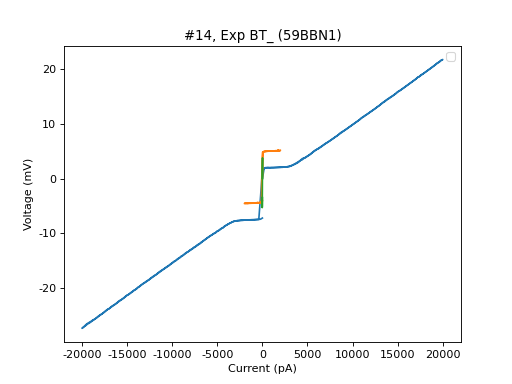

No handles with labels found to put in legend.


In [10]:
bpbi(range(12,15))

R divider scheme, Rsh = 1 M, Rb = 1G, but w/o I recalculation yet

In [141]:
20e-3/20e-9/1e6

1.0

<IPython.core.display.Javascript object>


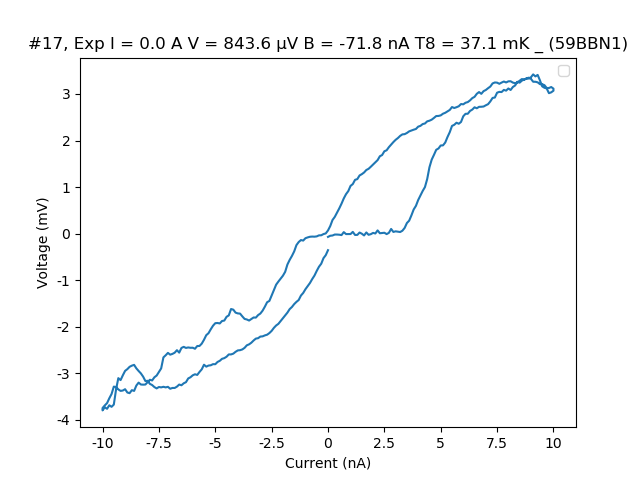

No handles with labels found to put in legend.


In [20]:
bpbi([17])

Implemented Keithley_Iscr class, I is recalculated (or supposed to) from I_nominal and V_meas

<IPython.core.display.Javascript object>


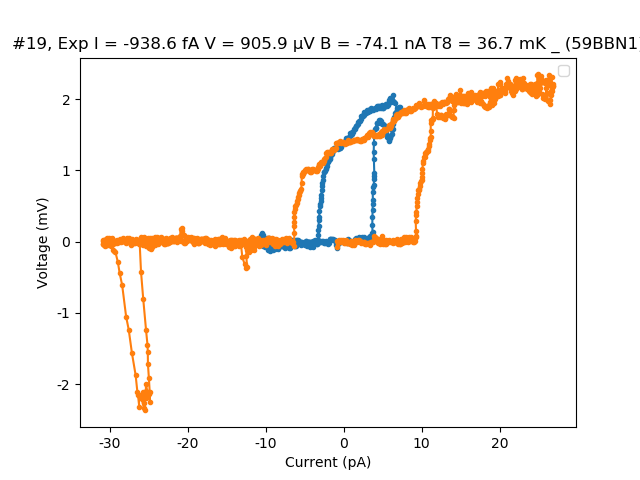

No handles with labels found to put in legend.


In [23]:
bpbi([18, 19], marker = '.')

not really, ma i should remove Voffset first to recalculate I correctly?

<IPython.core.display.Javascript object>


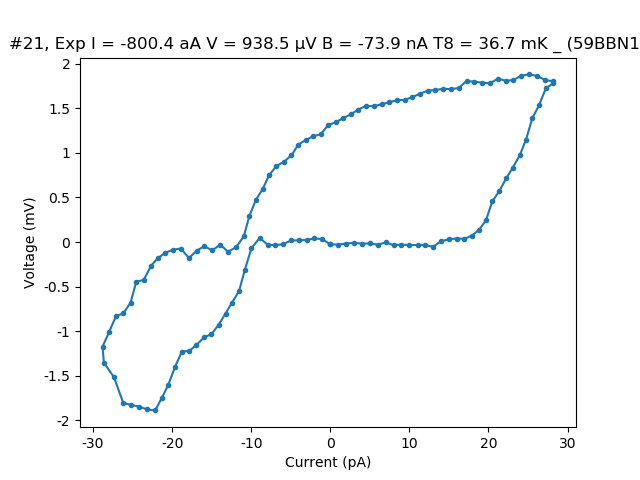

([<matplotlib.axes._subplots.AxesSubplot at 0x9891bb0>], [None])

In [32]:
pbi(21, marker = '.')

Is x still equidistant?

<IPython.core.display.Javascript object>


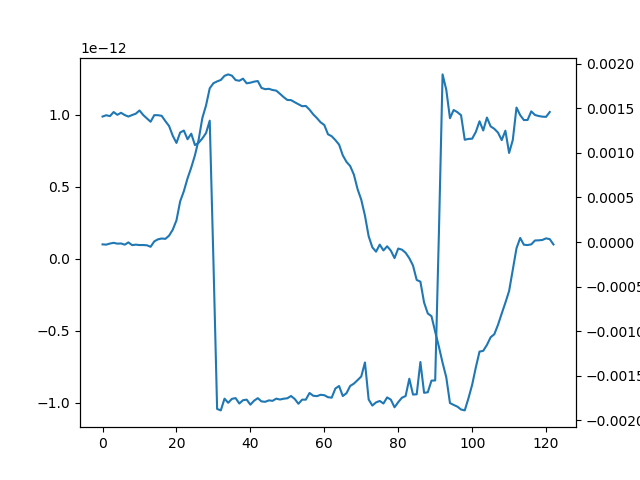

In [34]:
x, y = xy_by_id(21)
fig, ax = plt.subplots()
ax.plot(np.diff(x))

ax2 = ax.twinx()
ax2.plot(y)

looks reasonable?

<IPython.core.display.Javascript object>


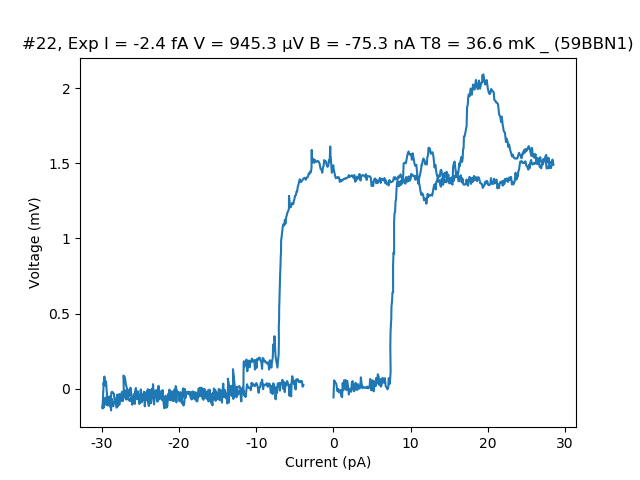

([<matplotlib.axes._subplots.AxesSubplot at 0xea338b0>], [None])

In [42]:
pbi(22)

still looks like hysterisys due to time delay, try tfsstb = 0.5

issue: when i tried to set fast 6 (or set tfsstb = 0.5??), measured voltage is noisy ??

<IPython.core.display.Javascript object>


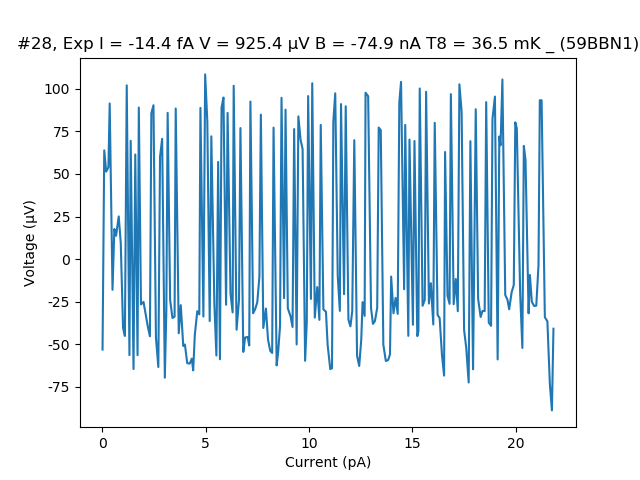

([<matplotlib.axes._subplots.AxesSubplot at 0x1228f810>], [None])

In [60]:
pbi(28)

0.1s works ok

<IPython.core.display.Javascript object>


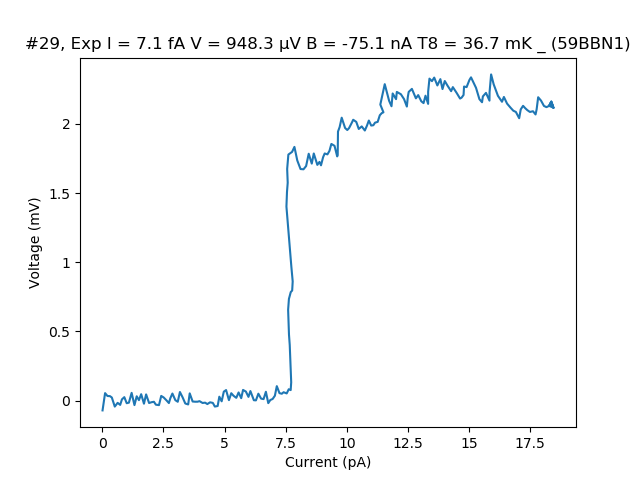

([<matplotlib.axes._subplots.AxesSubplot at 0x13a96cb0>], [None])

In [64]:
pbi(29)

don't touch fast 6, just .5 delay

<IPython.core.display.Javascript object>


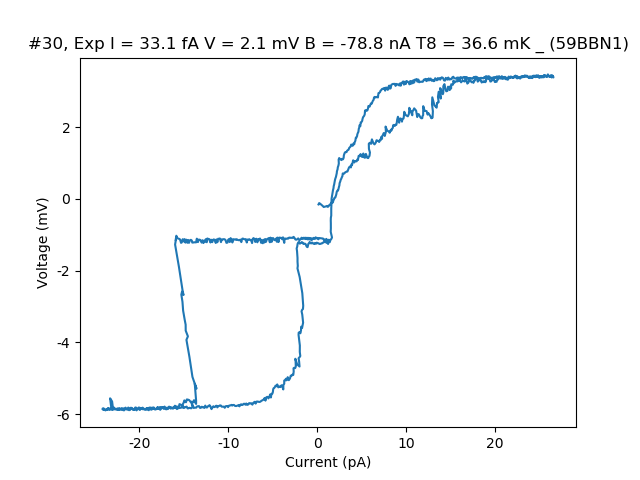

([<matplotlib.axes._subplots.AxesSubplot at 0x147c6c50>], [None])

In [69]:
pbi(30)

1s

<IPython.core.display.Javascript object>


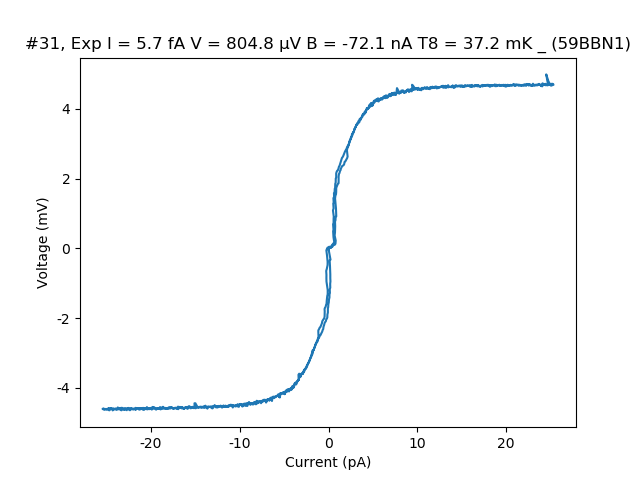

([<matplotlib.axes._subplots.AxesSubplot at 0x15270050>], [None])

In [73]:
pbi(31)

<IPython.core.display.Javascript object>


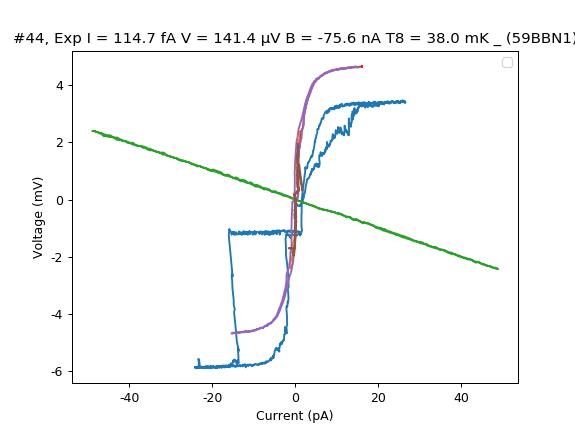

No handles with labels found to put in legend.


In [100]:
bpbi([30,37,41,42,43,44])

WS: After some investigation, I noticed that one of the wire was loose (V+) and I fixed it. I'm not sure when does this happened but after runid=43 the data are consistent between each other.

No large discharging time (on a scale of 1s instead of 7s), no OVFL voltage on 1Gohm Rb.)

However the voltage across Rb is still inconsistent between Rb=100Mohm vs Rb = 1Gohm. 

<IPython.core.display.Javascript object>


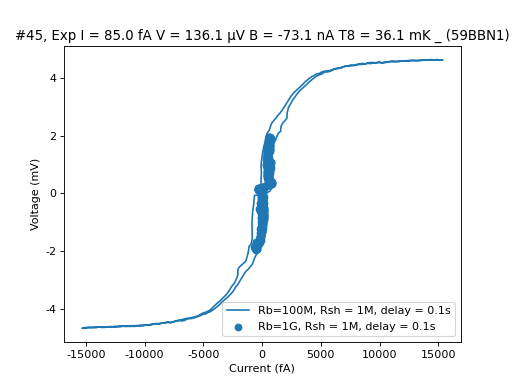

In [12]:
bpbi([43,45], labels = ['Rb=100M, Rsh = 1M, delay = 0.1s',
                           'Rb=1G, Rsh = 1M, delay = 0.1s'])#,
#                            'Rb=1G, Rsh = 1M, delay = 1s'])

In [108]:
.2e-3/.6e-12 / 1e9

0.33333333333333337

In [455]:
plt.close()

<IPython.core.display.Javascript object>


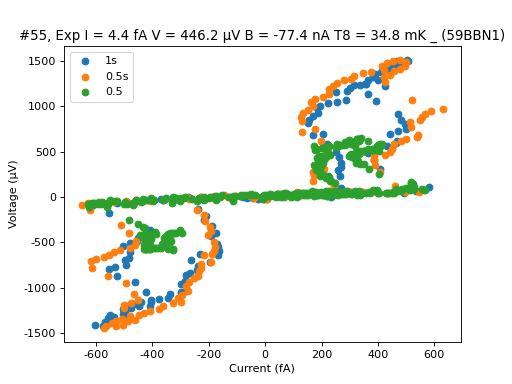

In [29]:
ls = ['1s', '0.5s', '0.5']
bpbi([53, 54,55], labels = ls)

<IPython.core.display.Javascript object>


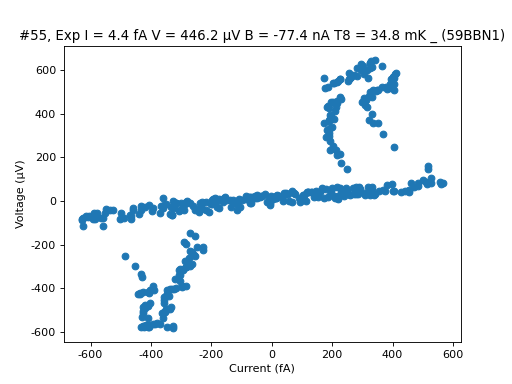

([<matplotlib.axes._subplots.AxesSubplot at 0xa8f06d0>], [None])

In [31]:
pbi(55)

0.5s, 1M/100M

<IPython.core.display.Javascript object>


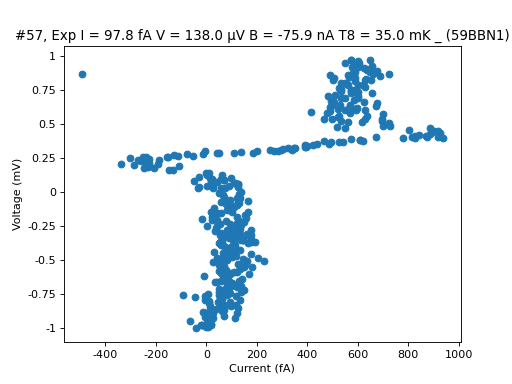

([<matplotlib.axes._subplots.AxesSubplot at 0xdc4c4d0>], [None])

In [39]:
pbi(57)

shape is the same, but there's an offset, for some reason
back to 1M/1G

## IVC fine step

<IPython.core.display.Javascript object>


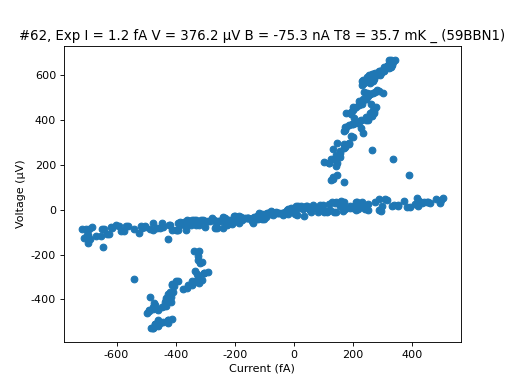

([<matplotlib.axes._subplots.AxesSubplot at 0xe0996d0>], [None])

In [54]:
pbi(62)

### Vdrop

V drop across Rb

Iscale is not correct

<IPython.core.display.Javascript object>


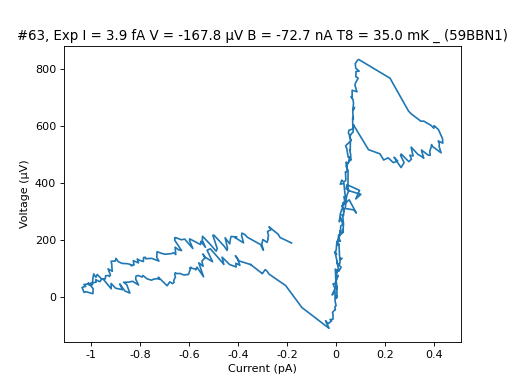

([<matplotlib.axes._subplots.AxesSubplot at 0xe0369f0>], [None])

In [53]:
pbi(63)

## IVC large scan

<IPython.core.display.Javascript object>


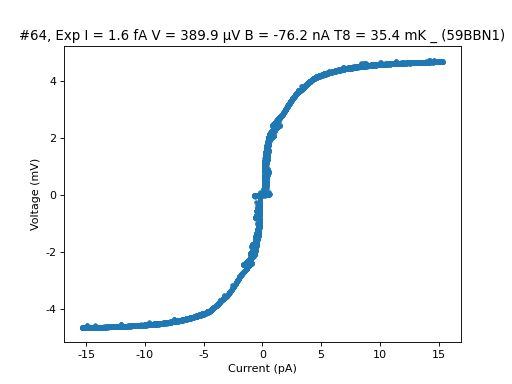

([<matplotlib.axes._subplots.AxesSubplot at 0x1758bdb0>], [None])

In [124]:
pbi(64, marker='.', ls = 'None')

<IPython.core.display.Javascript object>


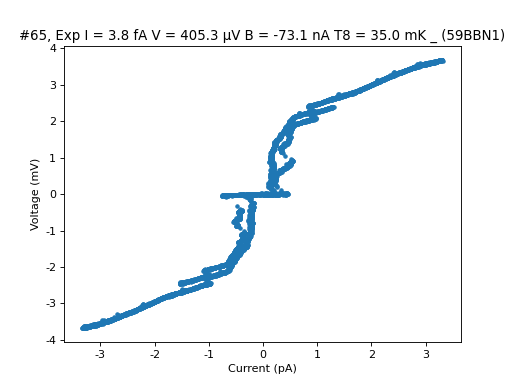

([<matplotlib.axes._subplots.AxesSubplot at 0x20b55950>], [None])

In [279]:
pbi(65, marker='.', ls = 'None')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


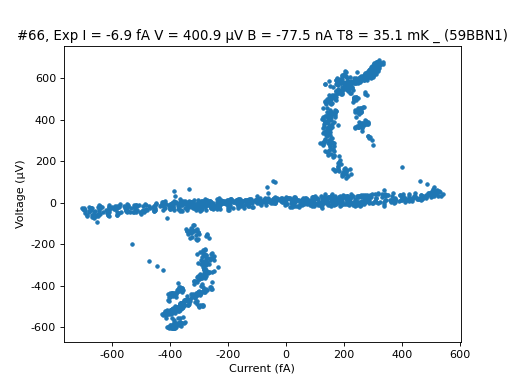

([<matplotlib.axes._subplots.AxesSubplot at 0x35957e90>], [None])

In [459]:
pbi(66, marker='.', ls = 'None')

## B scan

<IPython.core.display.Javascript object>


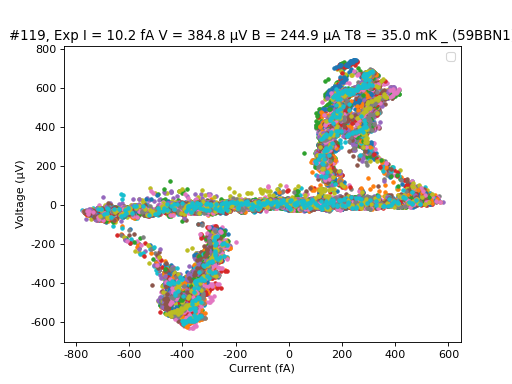

No handles with labels found to put in legend.


In [104]:
ids = [70 +i*1 for i in range(50)]
bpbi(ids, marker='.', ls = 'None')

In [126]:
.1e-3/1e-12/1e9

0.1

After confirming with old data, the FF should be around 1.85mA since we have smaller SQUID loop in the old design.

<IPython.core.display.Javascript object>


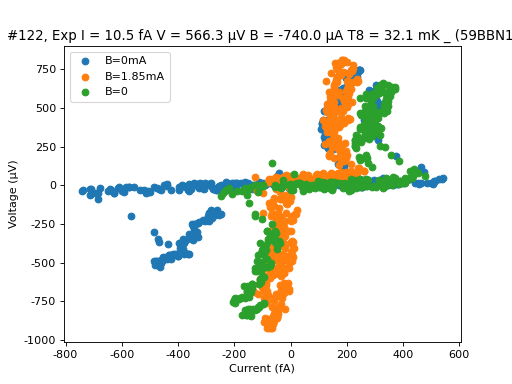

In [121]:
bpbi([70,121,122],labels = ['B=0mA','B=1.85mA', 'B=0'])

## B scan with new ZF FF

<IPython.core.display.Javascript object>


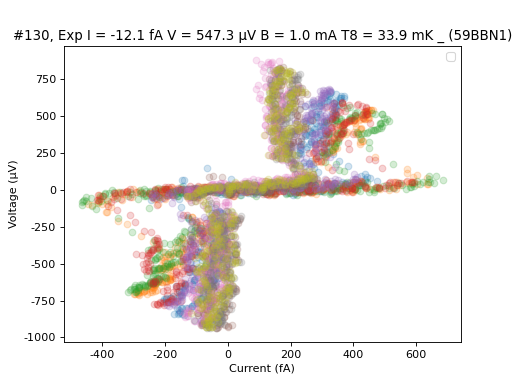

No handles with labels found to put in legend.


In [123]:
bpbi(range(122, 131), alpha = 0.2)

### N_avg = 10

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


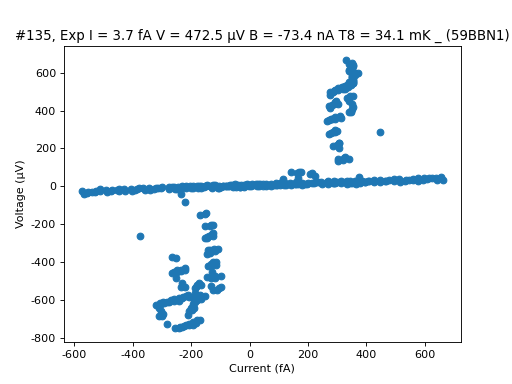

([<matplotlib.axes._subplots.AxesSubplot at 0x37853850>], [None])

In [465]:
pbi(135,  marker = 'o', ls = '')

<IPython.core.display.Javascript object>


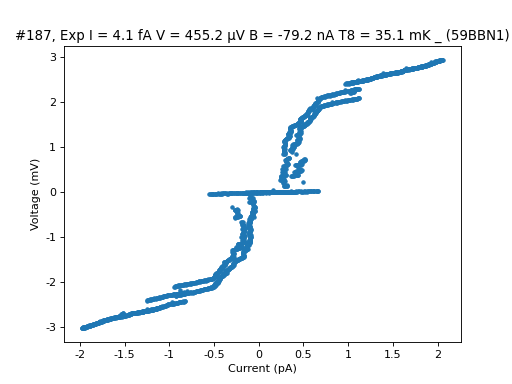

([<matplotlib.axes._subplots.AxesSubplot at 0x15ffb890>], [None])

In [142]:
pbi(187, marker ='.', ls = 'None')

In [134]:
70e-6/1.25e-12/1e6

56.0

## Bscan again

### Runid table

In [194]:
npls = np.linspace

keys  = [             'ids',    'T',    'B',                 'Fb']
valss = [[range( 136,  186+1),  32e-3,  npls(  0e-6,2e-3,51),        0],
         [range( 191,  241+1),  32e-3,  npls(  0e-6,2e-3,51),        1e-3],
         [range( 242,  292+1),  32e-3,  npls(  0e-6,-2e-3,51),        -1e-3],
         [range( 294,  344+1),  200e-3,  npls(  0e-6,2e-3,51),        1e-3]]


runid_table = [{ key : val for key, val in zip(keys, vals)  }  for vals in valss ]

<IPython.core.display.Javascript object>


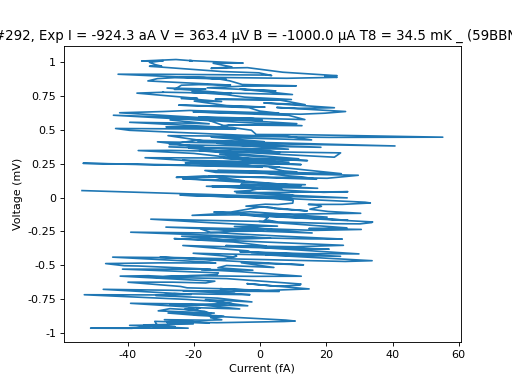

([<matplotlib.axes._subplots.AxesSubplot at 0xbb42370>], [None])

In [26]:
pbi(292)

<IPython.core.display.Javascript object>


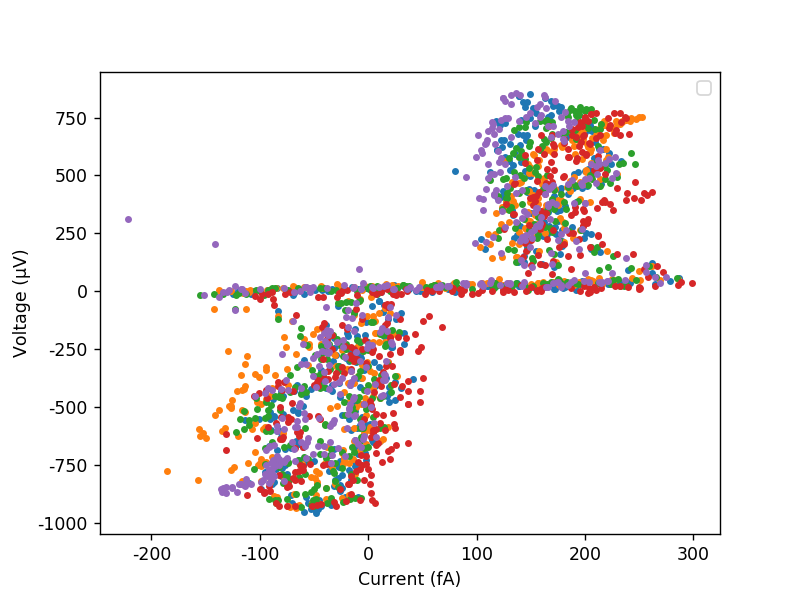

No handles with labels found to put in legend.


In [13]:

ids = [177 +i*1 for i in range(5)]
bpbi(ids, marker='.', ls = '')

<IPython.core.display.Javascript object>


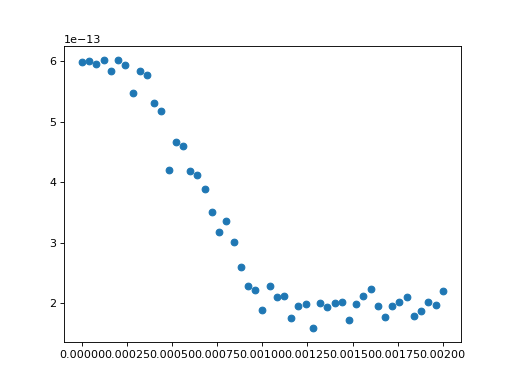

<IPython.core.display.Javascript object>


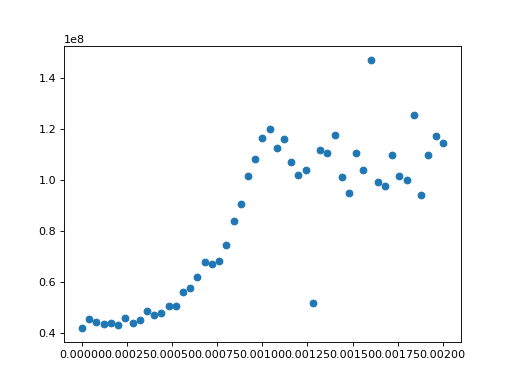

In [163]:
Vth = 40e-6
B_list =    np.linspace(  0e-6,2e-3,51)

Isws = []
R0s = []
    
fig, ax = plt.subplots()    
c
for idx in range( 136,  186+1):
    
    I, V = xy_by_id(idx)
    
#     V -= 15e-6
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    
    
ax.plot(B_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(B_list, R0s, 'o')  
    

There's no fill suppression, even at B = 1.85e-3

<IPython.core.display.Javascript object>


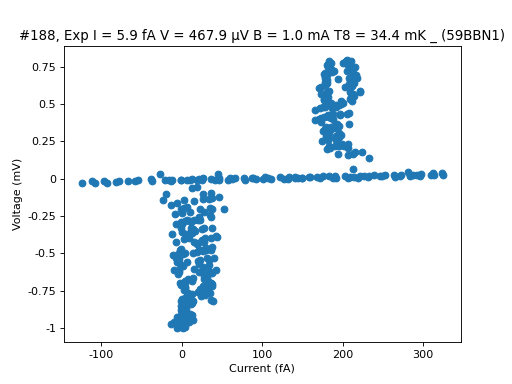

([<matplotlib.axes._subplots.AxesSubplot at 0x19fff910>], [None])

In [165]:
pbi(188)

AH, ok, it was just limit for ch A (1mA)
set 1mA + 0.85

<IPython.core.display.Javascript object>


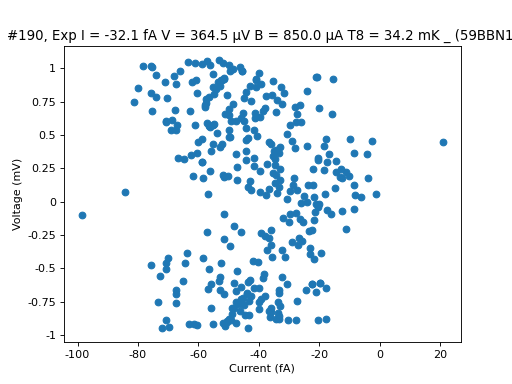

([<matplotlib.axes._subplots.AxesSubplot at 0x1b217670>], [None])

In [176]:
pbi(190)

<IPython.core.display.Javascript object>


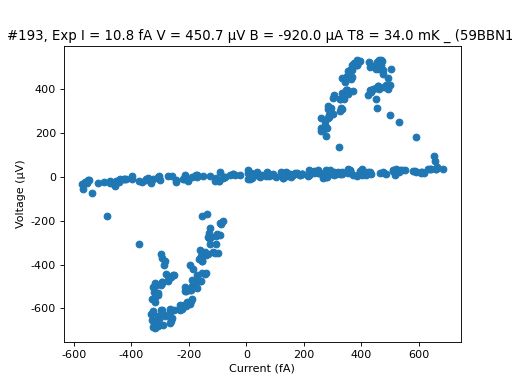

([<matplotlib.axes._subplots.AxesSubplot at 0x1b9421f0>], [None])

In [178]:
pbi(193)

<IPython.core.display.Javascript object>


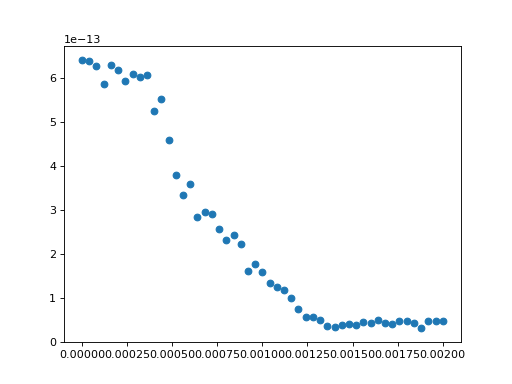

<IPython.core.display.Javascript object>


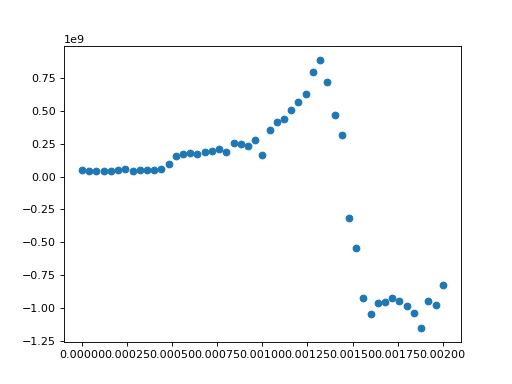

In [471]:
Vth = 60e-6
B_list =    np.linspace(  0e-6,2e-3,51)

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for idx in range( 191,  241+1):
    
    I, V = xy_by_id(idx)
    
#     V -= 15e-6
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    
    
ax.plot(B_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(B_list, R0s, 'o')  
    

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


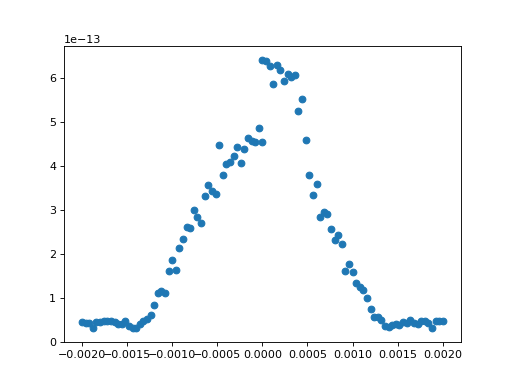

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


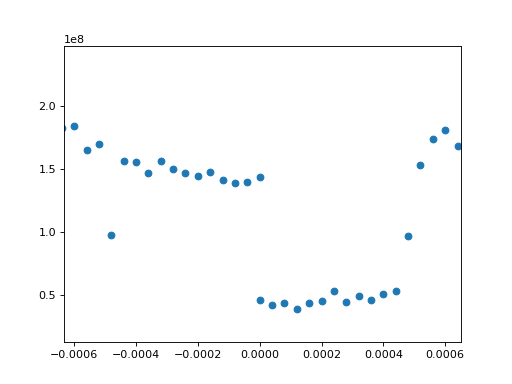

In [256]:
Vth = 60e-6
B_list =   np.append( np.linspace(  0e-6, 2e-3,51), np.linspace(  0e-6, -2e-3,51) )

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for idx in range( 191,  292+1):
    
    I, V = xy_by_id(idx)
    
#     V -= 15e-6
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    

    
cos = np.cos(np.pi/2*B_list/1.85e-3)    
    
ax.plot(B_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(B_list, R0s, 'o')  
    

In [257]:
2e6/30

66666.66666666667

### exps test

In [188]:
sample = '59BBN1'
folder = '\\JOSH-PC\OurData_OneDrive'

exp = Exps(sample, folder)

<IPython.core.display.Javascript object>


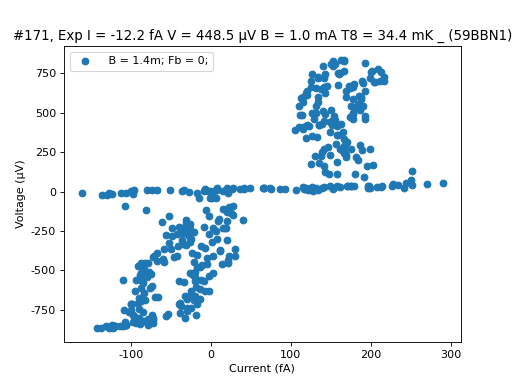

In [203]:
exp.load_old(runid_table)


exp.plot( {'B' : 1.4e-3, 'Fb' :0 } )

## 200mK

<IPython.core.display.Javascript object>


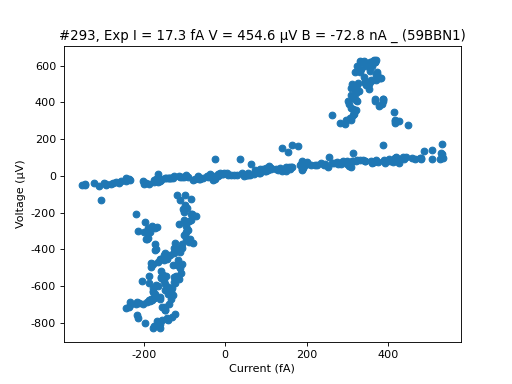

([<matplotlib.axes._subplots.AxesSubplot at 0x1f0827b0>], [None])

In [204]:
pbi(293)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


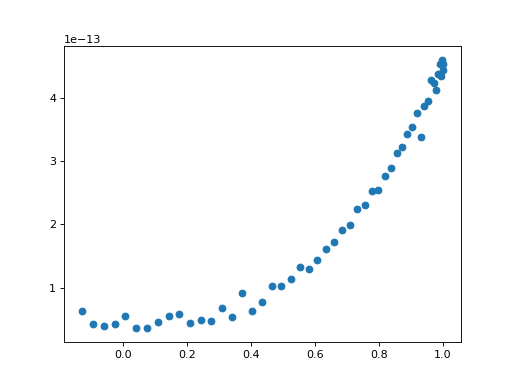

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


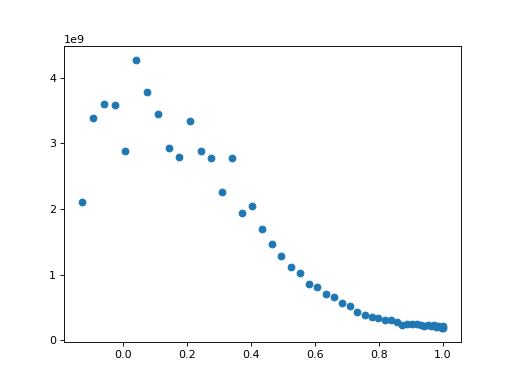

In [205]:
Vth = 160e-6
B_list =   np.linspace(  0e-6, 2e-3,51)

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for idx in range( 294,  344+1):
    
    I, V = xy_by_id(idx)
    
#     V -= 15e-6
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    

    
cos = np.cos(np.pi/2*B_list/1.85e-3)    
    
ax.plot(cos, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(cos, R0s, 'o')  
    

## manual T scan

In [217]:
Ts =  [ '50mK', '100mK', '125mK', '150mK', '175mK' ]
ids = [  345,    346,      347,     348,     349  ]

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


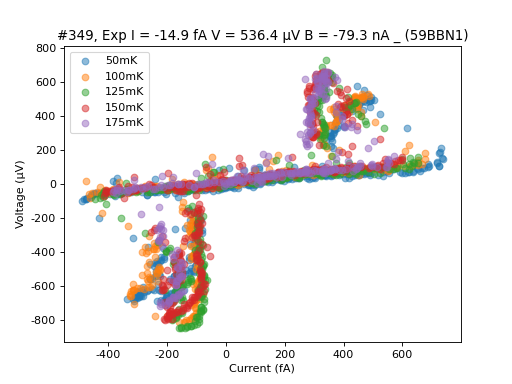

In [222]:
bpbi(ids, labels = Ts, alpha = 0.5)

In [244]:
Ts =  [ '200mK', '225mK', '250mK', '275mK' ]
ids = [ 350 , 351, 352, 353 ]

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


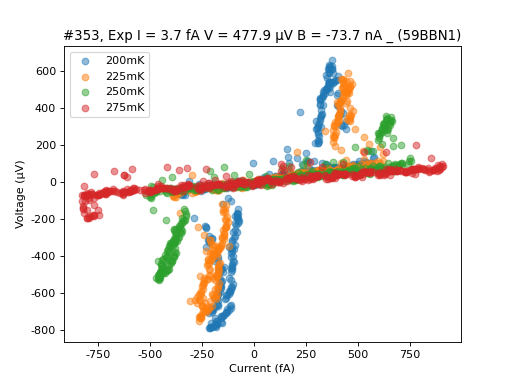

In [245]:
bpbi(ids, labels = Ts, alpha = 0.5, marker = 'o', ls ='None')

<IPython.core.display.Javascript object>


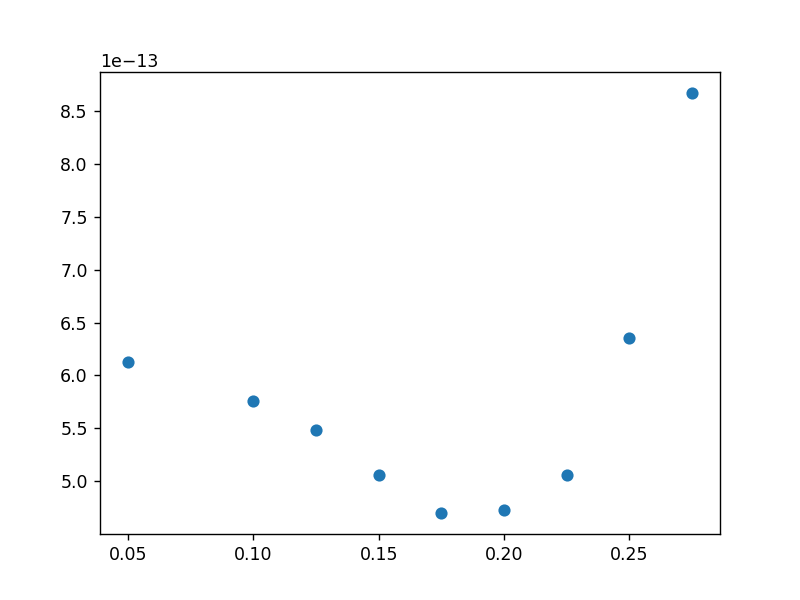

<IPython.core.display.Javascript object>


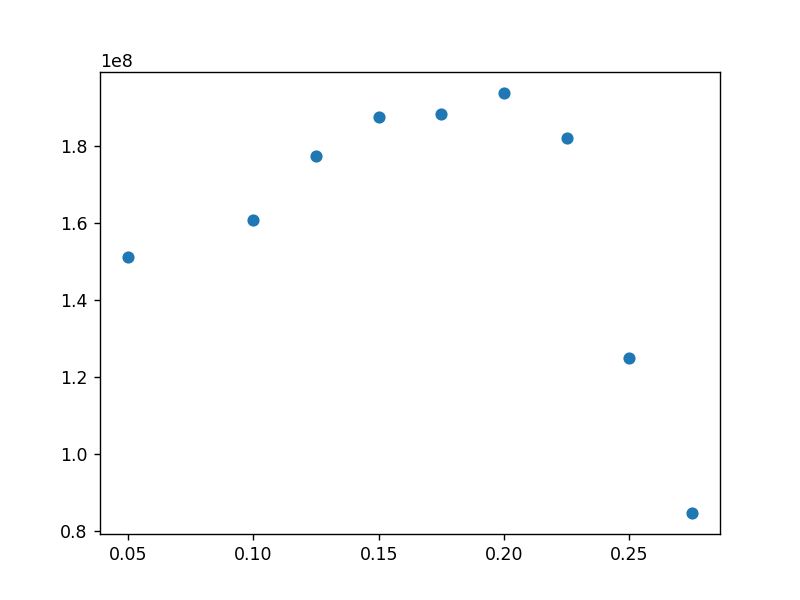

<IPython.core.display.Javascript object>


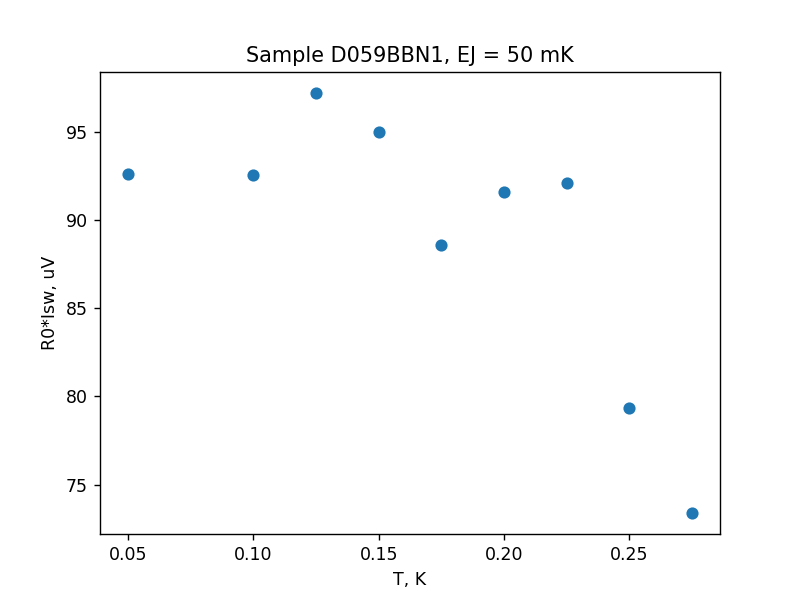

Text(0.5, 1.0, 'Sample D059BBN1, EJ = 50 mK')

In [27]:
Vth = 160e-6
T_list =   np.array([50, 100, 125, 150, 175, 200, 225, 250, 275]) * 1e-3

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for idx in range( 345,  353+1):
    
    I, V = xy_by_id(idx)
    
#     V -= 15e-6
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    

    
   
    
ax.plot(T_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(T_list, R0s, 'o')  

Isws = np.array(Isws)
R0s = np.array(R0s)

fig, ax = plt.subplots() 
ax.plot(T_list, Isws*R0s*1e6, 'o')  

ax.set_xlabel('T, K')
ax.set_ylabel('R0*Isw, uV')

ax.set_title('Sample D059BBN1, EJ = 50 mK')

    

ABove 250 it's unclear whether 'critical current branch' is supercurrent at all

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


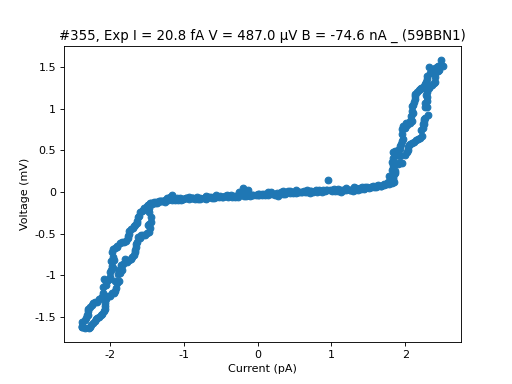

([<matplotlib.axes._subplots.AxesSubplot at 0x22a718d0>], [None])

In [249]:
pbi(355, marker = 'o', ls ='None')

ok, but let's check FF

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


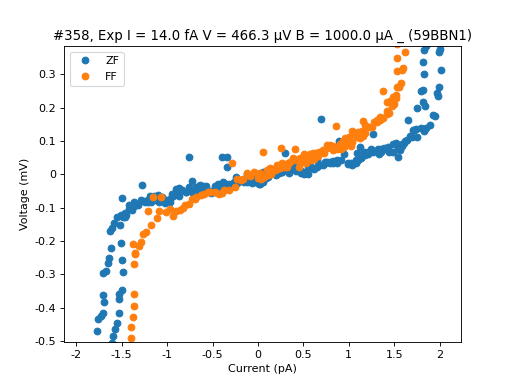

In [267]:
bpbi([357, 358], labels = ['ZF', 'FF'], marker = 'o', ls ='None')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


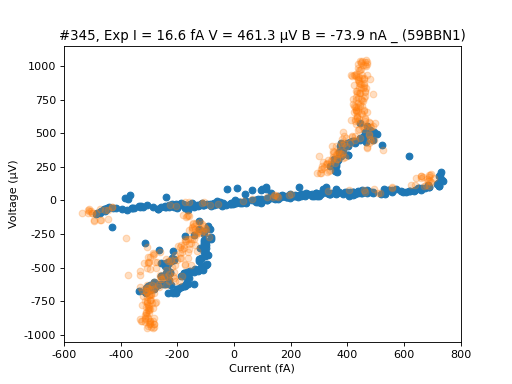

([<matplotlib.axes._subplots.AxesSubplot at 0x2059a8b0>], [None])

In [287]:
Izfs, Vzfs = xy_by_id(363)
Iffs, Vffs = xy_by_id(364)



izf = V_func(Vzfs, Izfs, Vffs ) - 0.0e-12


fig, ax = plt.subplots()


ax.plot( izf - Iffs, Vffs, marker = 'o', ls = 'None', color = 'C1', alpha = 0.25   )


pbi(345, axes = ax, color = 'C0')


Tscan again, for ZF an FF to extract sc branch

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


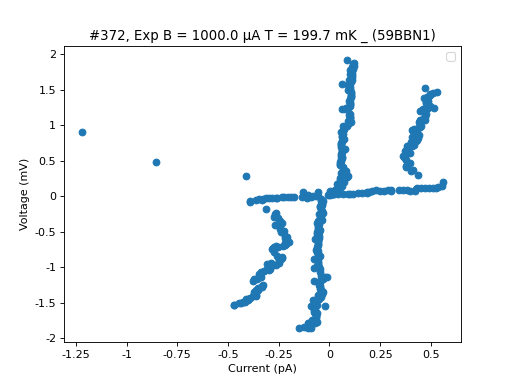

No handles with labels found to put in legend.


In [295]:
bpbi([371, 372], ls = 'None', marker = 'o')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


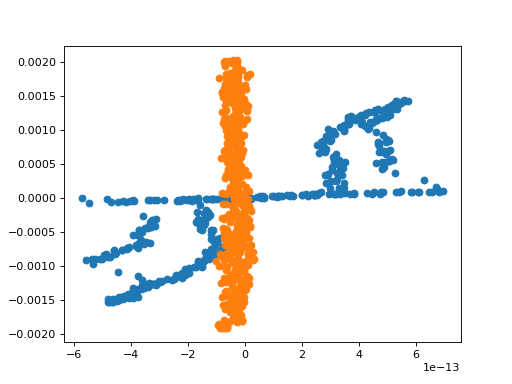

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


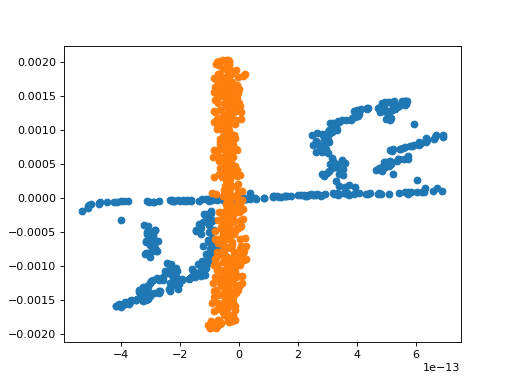

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


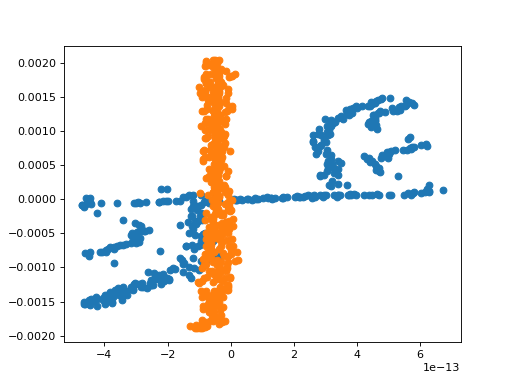

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


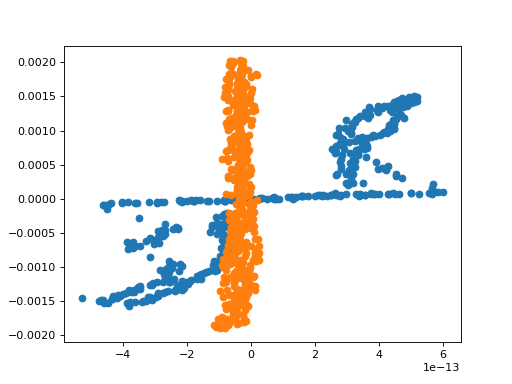

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


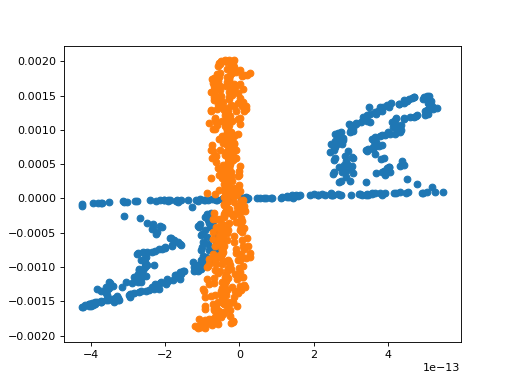

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


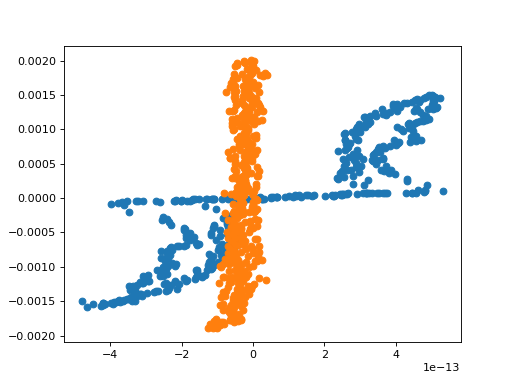

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


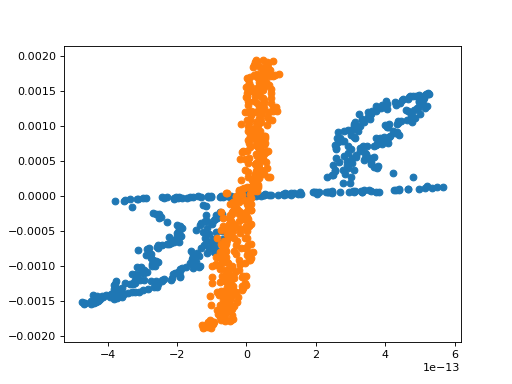

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


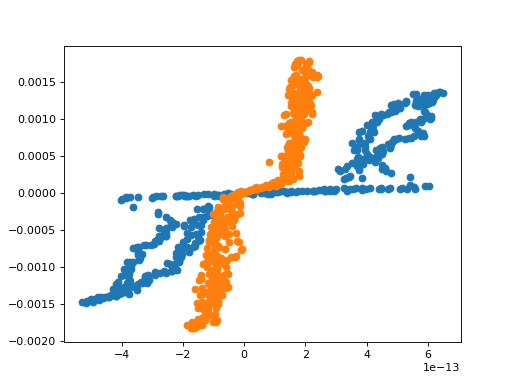

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


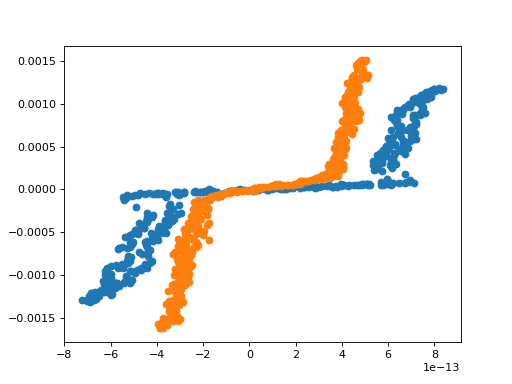

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


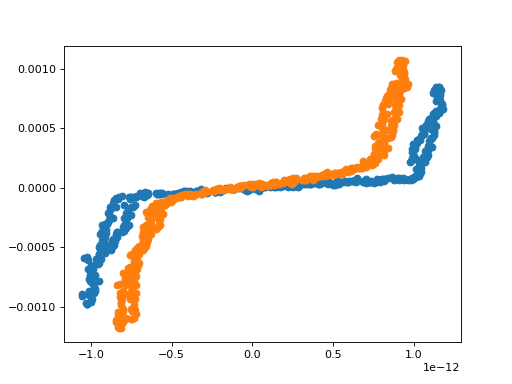

In [338]:
for i in range(10):

    fig, ax = plt.subplots()

    for idx in [424 +i*2, 425 +i*2]:
        I, V = xy_by_id(idx)
        ax.plot(I,V, ls = 'None', marker = 'o')

<IPython.core.display.Javascript object>


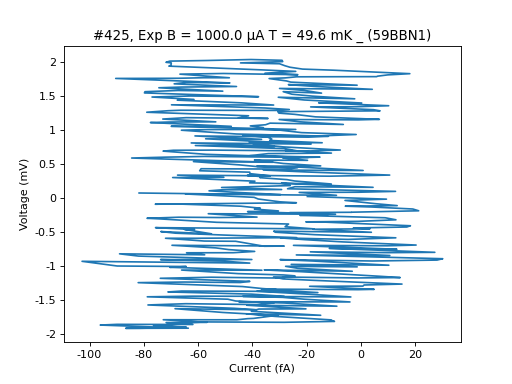

([<matplotlib.axes._subplots.AxesSubplot at 0xbb37e50>], [None])

In [27]:
pbi(425)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


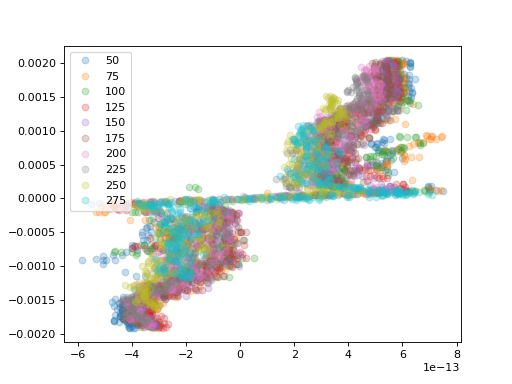

In [339]:

fig, ax = plt.subplots()


leg = [50 + 25*i for i in range (10) ]

for i in range(10):


    Izfs, Vzfs = xy_by_id(424 +i*2)
    Iffs, Vffs = xy_by_id(425 +i*2)

    izf = V_func(Vzfs, Izfs, Vffs ) - 0.0e-12

    ax.plot( izf - Iffs, Vffs, marker = 'o', ls = 'None', alpha = 0.25, label = leg[i]   )


#     pbi(345, axes = ax, color = 'C0')
ax.legend()

fwd only scan

<IPython.core.display.Javascript object>


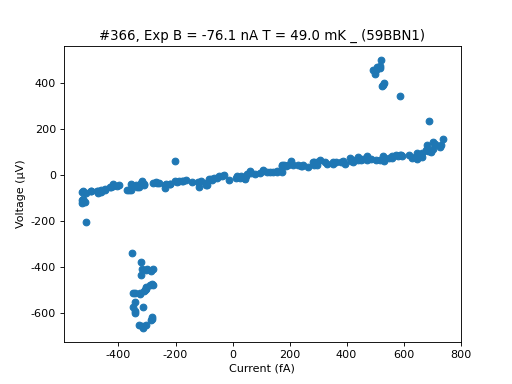

([<matplotlib.axes._subplots.AxesSubplot at 0x257b4b30>], [None])

In [293]:
pbi(366)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


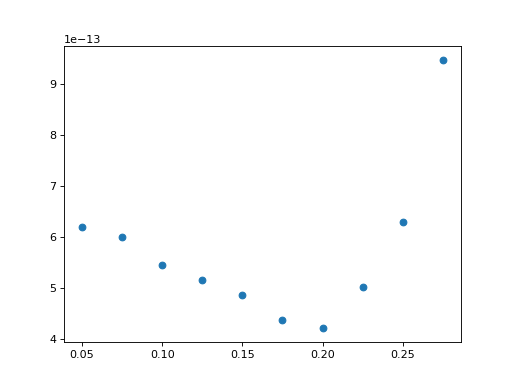

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


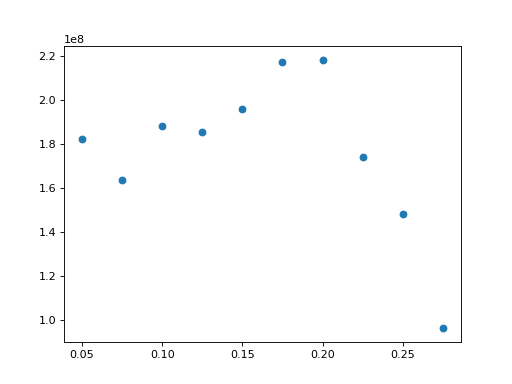

In [340]:
Vth = 120e-6
T_list = np.array( [50 + 25*i for i in range (10) ] )*1e-3

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for i in range(10):
    
    Izfs, Vzfs = xy_by_id(424 +i*2)
    Iffs, Vffs = xy_by_id(425 +i*2)

    izf = V_func(Vzfs, Izfs, Vffs )
    
    Isc = izf  [abs(Vffs) < Vth]
    Vsc = Vffs [abs(Vffs) < Vth]
    
#     ax.plot(Isc, Vsc)
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    

    
   
    
ax.plot(T_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(T_list, R0s, 'o')  

repeat udu meas, look for sudden jump in Ro

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


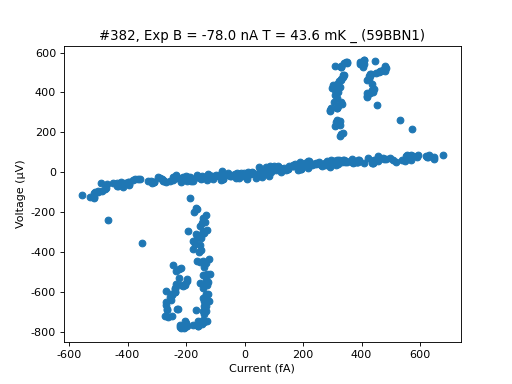

C:\Users\KelvinOX25\Documents\GitHub\measDC\JJ_data_processing.py:244: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  def get_Isw_R0_by_id (idx, dx = 10e-9, dy = 50e-6):


<IPython.core.display.Javascript object>


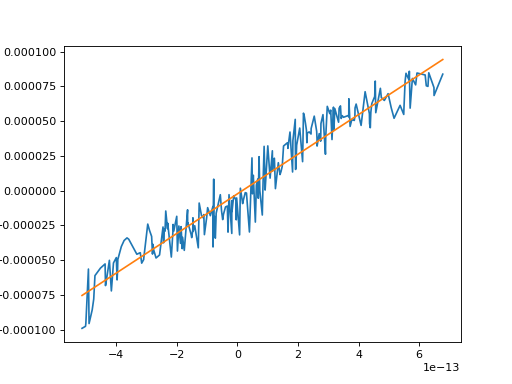

(5.94821988011988e-13, 142729099.25750196)

In [328]:
pbi(382)

get_Isw_R0_by_id(382,VERBOSE = True, dy = 100e-6)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


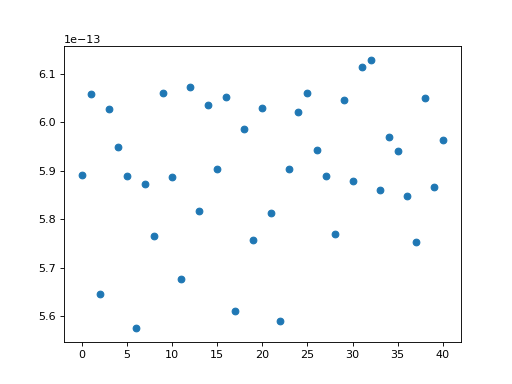

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


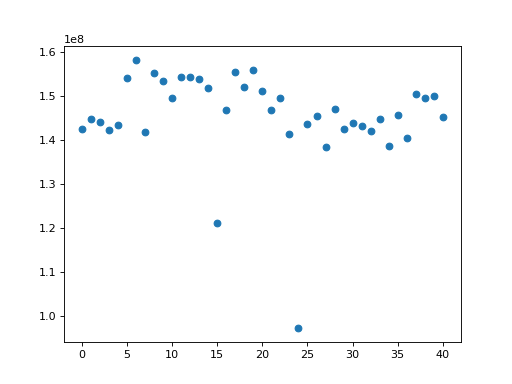

In [335]:
Isws, R0s = [], []

for idx in range(383, 423+1):
    
    Isw, R0 = get_Isw_R0_by_id(idx,VERBOSE = False, dy = 100e-6)
    
    Isws.append(Isw)
    R0s.append(R0)
    
fig, ax = plt.subplots()
ax.plot(Isws, marker = 'o', ls = '')

    
fig, ax = plt.subplots()
ax.plot(R0s, marker = 'o', ls = '')

## IVC at 1 Flux0

why there's I offset?
 
B = 1 F0

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


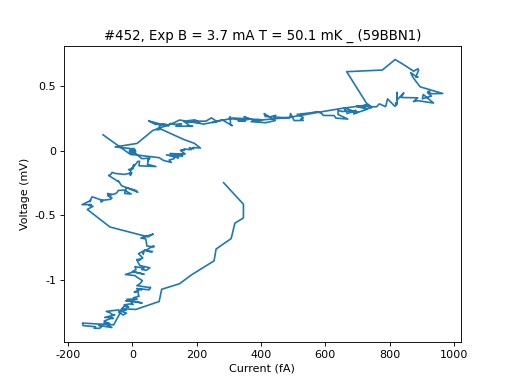

In [366]:
ax, _ = pbi(452)

B = -1F0

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


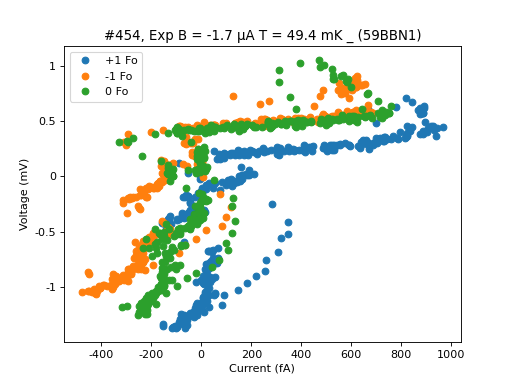

In [376]:
labs = ['+1 Fo', '-1 Fo', '0 Fo']

bpbi([452, 453, 454], marker = 'o' , ls = '',
                labels = labs)

When I is set to 0, V is 1mV!

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


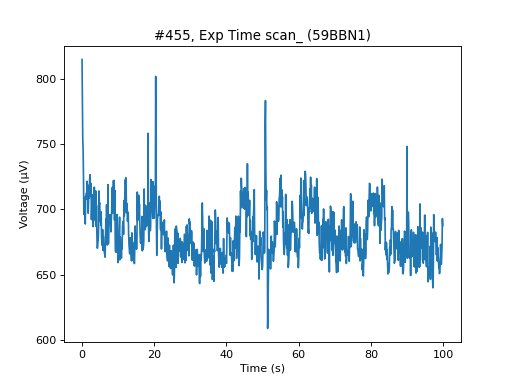

([<matplotlib.axes._subplots.AxesSubplot at 0x2093bff0>], [None])

In [377]:
pbi(455)

### udu in B (check hysterisys)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


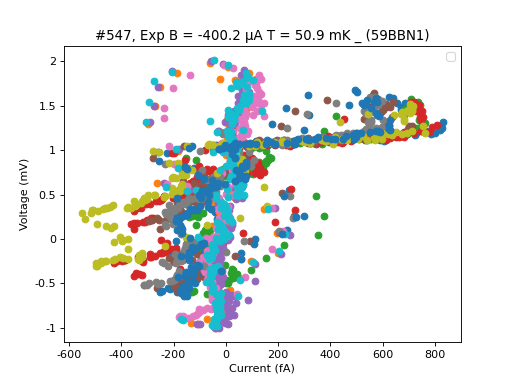

No handles with labels found to put in legend.


In [399]:
bpbi( range(467, 549+1, 8), marker = 'o', ls = '')

In [400]:
Vth = 150e-6
B_list = udu_list ( 4e-3, 0.2e-3)

Isws = []
R0s = []
    
   

for idx in range( 467,  549+1):
    
    I, V = xy_by_id(idx)
    
    V -= 1.15e-3
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    


C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


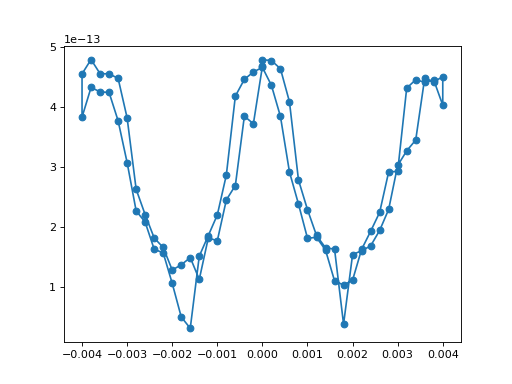

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


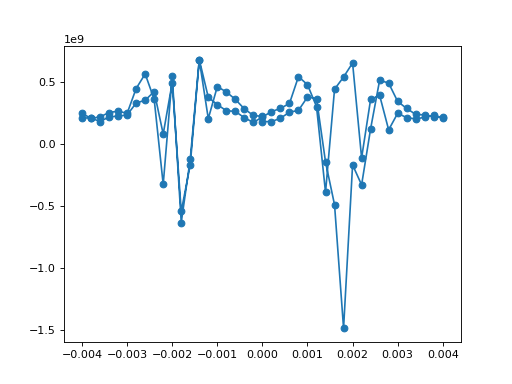

In [401]:
fig, ax = plt.subplots() 
    
cos = np.cos(np.pi/2*B_list/1.85e-3)    
    
# ax.plot(cos, Isws, 'o') 

ax.plot(B_list, Isws, 'o-') 


fig, ax = plt.subplots() 
# ax.plot(cos, R0s, 'o')

ax.plot(B_list, R0s, 'o-')
    

No futher idea, just keep measuring ivc to see sudden jump in R..

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


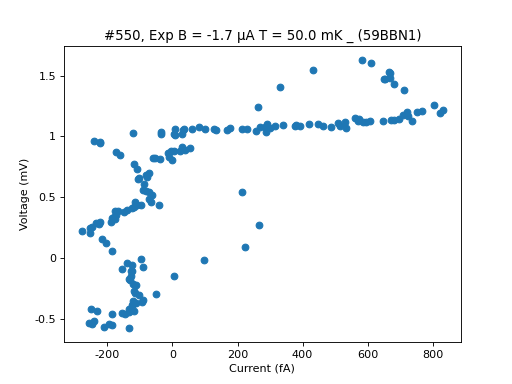

([<matplotlib.axes._subplots.AxesSubplot at 0x31085bb0>], [None])

In [405]:
pbi(550, marker = 'o', ls = '')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


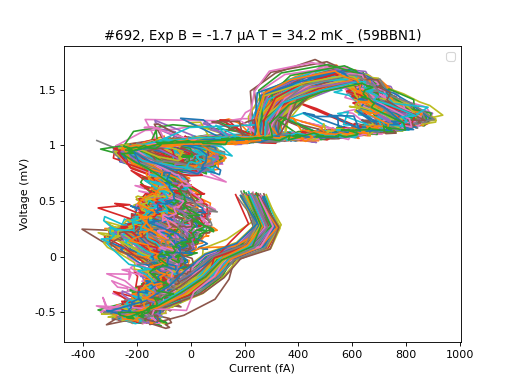

No handles with labels found to put in legend.


In [406]:
bpbi(range(550,693))

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


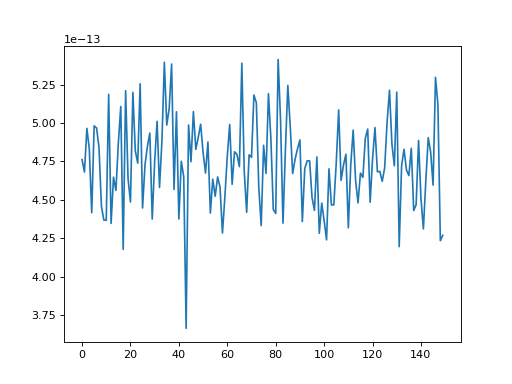

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


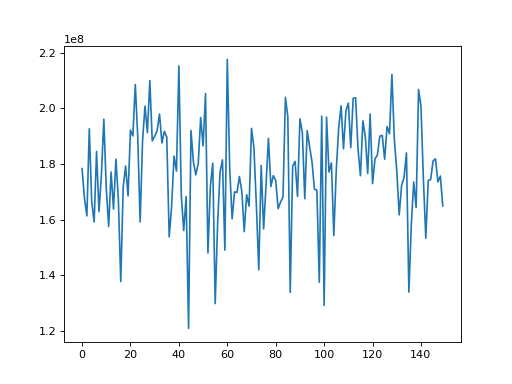

In [407]:
Isws, R0s = [], []

for idx in range(550,699+1):
    
    I, V = xy_by_id(idx)
    
    V -= 1.15e-3
    
    Isc = I [abs(V) < Vth]
    Vsc = V [abs(V) < Vth]
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    
    
fig, ax = plt.subplots()

ax.plot(Isws)


    
fig, ax = plt.subplots()

ax.plot(R0s)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


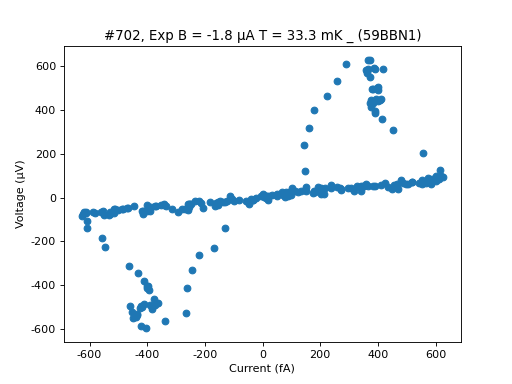

([<matplotlib.axes._subplots.AxesSubplot at 0x329a1650>], [None])

In [419]:
pbi(702, marker = 'o', ls = '')

In [418]:
Isw, R0 = get_Isw_R0_by_id(702, dy = 100e-6)

R0/1e6

130.50858498307633

## Tscan again


I removed this crazy offset by shunting/unshunting the sample

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


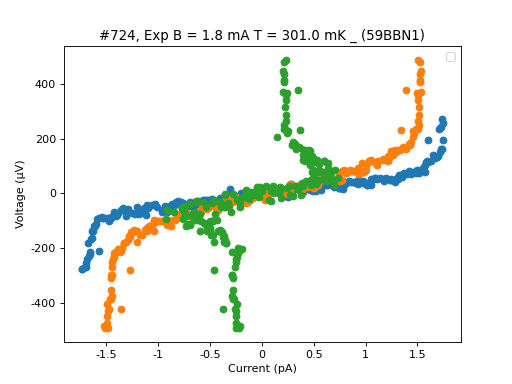

No handles with labels found to put in legend.


In [436]:
ax = bpbi([723,724], marker = 'o', ls = '')

Izfs, Vzfs = xy_by_id(703 +i*2)
Iffs, Vffs = xy_by_id(704 +i*2)

izf = V_func(Vzfs, Izfs, Vffs )

ax.plot(izf - Iffs, Vffs, marker = 'o', ls = '')


<IPython.core.display.Javascript object>


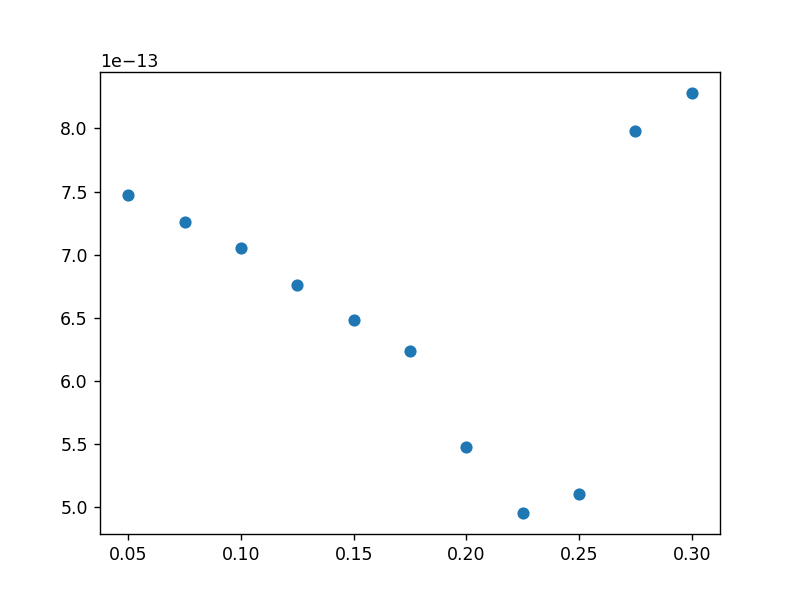

<IPython.core.display.Javascript object>


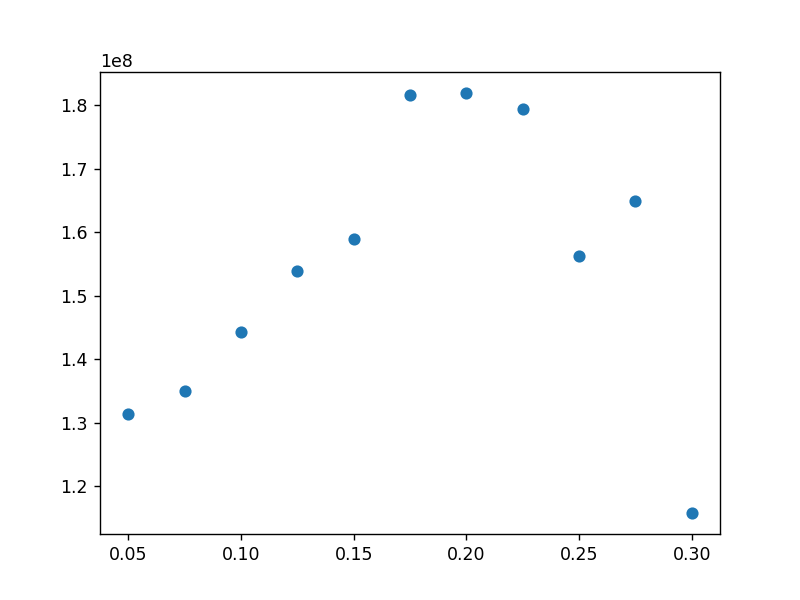

<IPython.core.display.Javascript object>


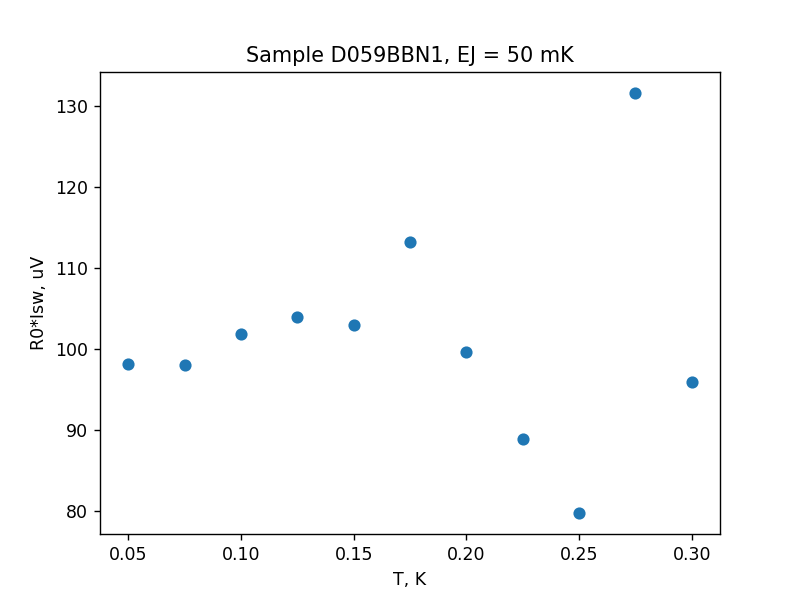

Text(0.5, 1.0, 'Sample D059BBN1, EJ = 50 mK')

In [29]:
Vth = 120e-6
T_list = np.array( [50 + 25*i for i in range (11) ] )*1e-3

Isws = []
R0s = []
    
fig, ax = plt.subplots()    

for i in range(11):
    
    Izfs, Vzfs = xy_by_id(703 +i*2)
    Iffs, Vffs = xy_by_id(704 +i*2)

    izf = V_func(Vzfs, Izfs, Vffs )
    
    Icp = izf - Iffs
    
    
    Isc = Icp  [abs(Vffs) < Vth]
    Vsc = Vffs [abs(Vffs) < Vth]
    
#     ax.plot(Isc, Vsc)
    
    Isw = (max(Isc) - min(Isc)) / 2
    
    Isws.append(Isw)
    
    z = np.polyfit(Isc, Vsc, 1)
    
    R0s.append(z[0])
    

    
   
    
ax.plot(T_list, Isws, 'o') 

fig, ax = plt.subplots() 
ax.plot(T_list, R0s, 'o')  




Isws = np.array(Isws)
R0s = np.array(R0s)

fig, ax = plt.subplots() 
ax.plot(T_list, Isws*R0s*1e6, 'o')  

ax.set_xlabel('T, K')
ax.set_ylabel('R0*Isw, uV')

ax.set_title('Sample D059BBN1, EJ = 50 mK')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\plotting.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, **subplots_kwargs)


<IPython.core.display.Javascript object>


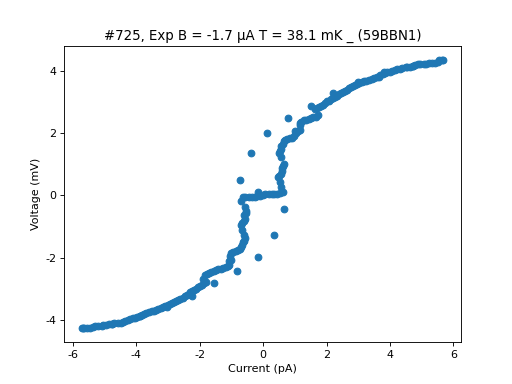

([<matplotlib.axes._subplots.AxesSubplot at 0x33168770>], [None])

In [434]:
pbi(725, marker = 'o', ls = '')

In [554]:
get_Isw_R0_by_id (728, dy = 50e-6)

(2.1934453226773247e-13, 98971847.09170765)

## Bscan at 200mK

Ej of the sq is 175, so do we expect something unusual when Ej being suppressed below T?

<IPython.core.display.Javascript object>


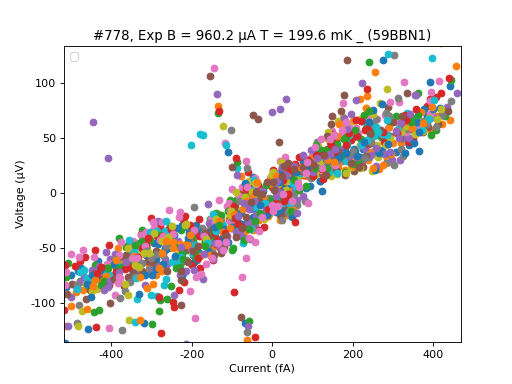

No handles with labels found to put in legend.


In [579]:
bpbi(range(752, 778+1), marker = 'o', ls = '')

remeas at BT

<IPython.core.display.Javascript object>


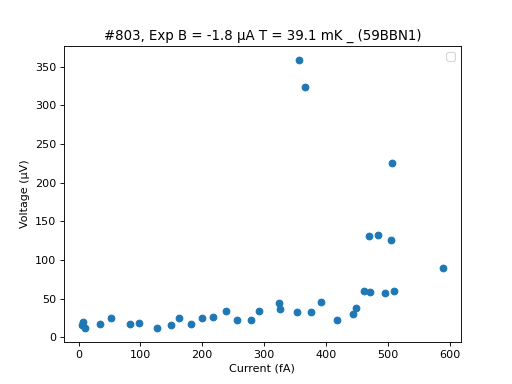

No handles with labels found to put in legend.


In [596]:
bpbi(range(803, 803+1), marker = 'o', ls = '')

## large scan IVC

<IPython.core.display.Javascript object>


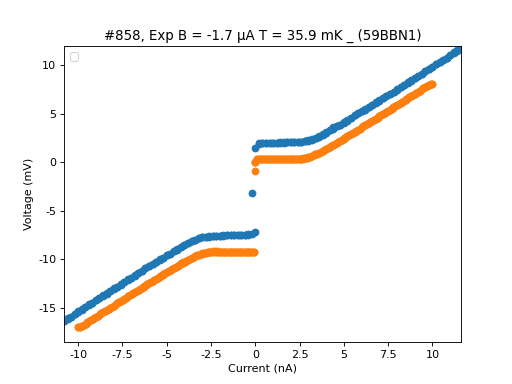

No handles with labels found to put in legend.


In [646]:
bpbi([12,858], marker = 'o', ls = '')

## Fine scan @ 200mK

<IPython.core.display.Javascript object>


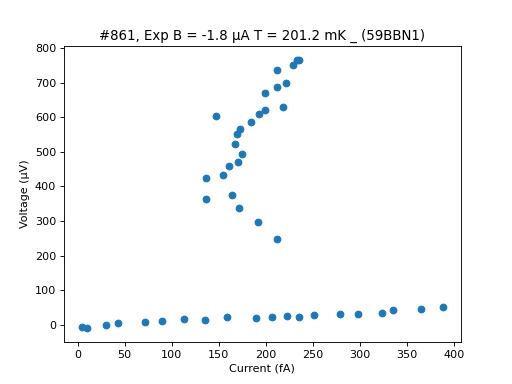

([<matplotlib.axes._subplots.AxesSubplot at 0x46f6d490>], [None])

In [656]:
pbi(861, marker = 'o', ls = '')

In [654]:
get_Isw_R0_by_id(859, dy = 100e-6)

(5.94727092907093e-13, 142302638.2422883)

## Bscan with fine IVC

<IPython.core.display.Javascript object>


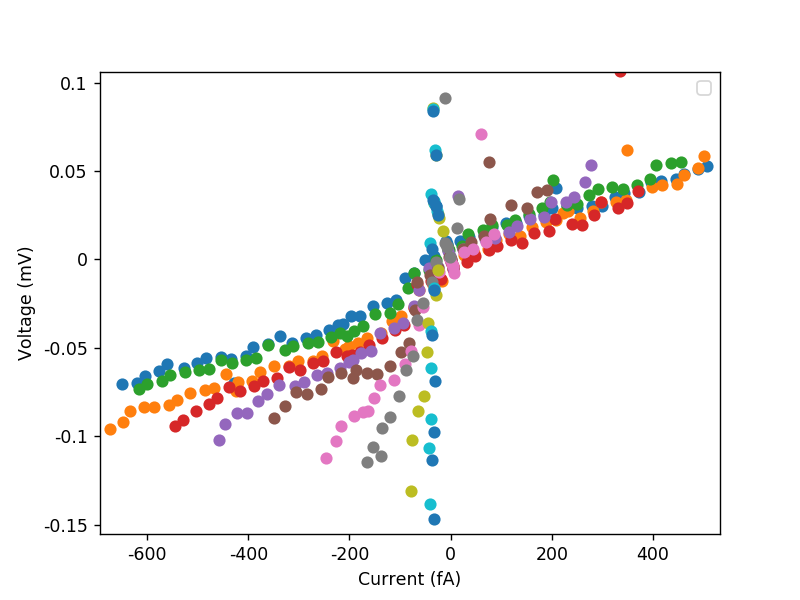

No handles with labels found to put in legend.


In [14]:
bpbi(range(873, 883+1), marker = 'o', ls = '')

## Time dependenciesm

I'm not sure why, but even this device seems to be very sensitive to the connection. 886-888 follows the same connection as in 723 before, but now looks different. Need come to lab to double check.*

<IPython.core.display.Javascript object>


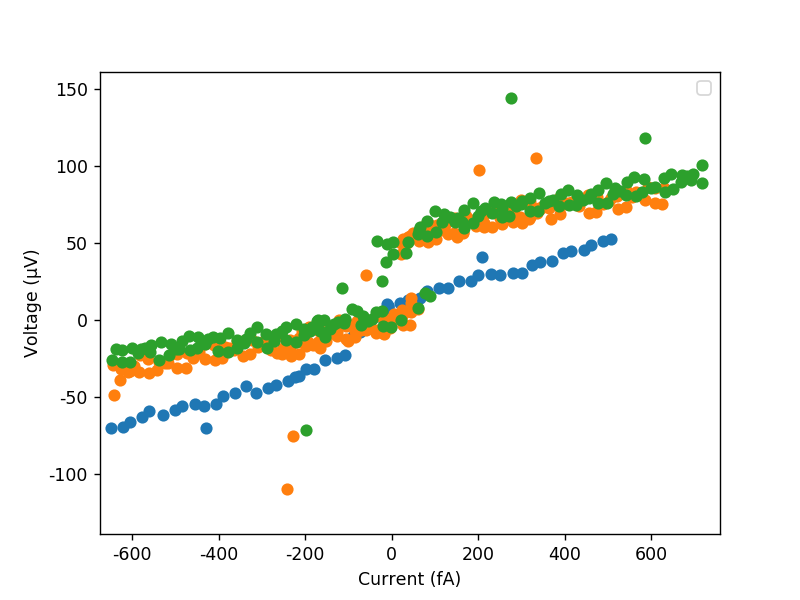

No handles with labels found to put in legend.


In [16]:
bpbi([873, 893, 894], marker ='o', ls = '')

<IPython.core.display.Javascript object>


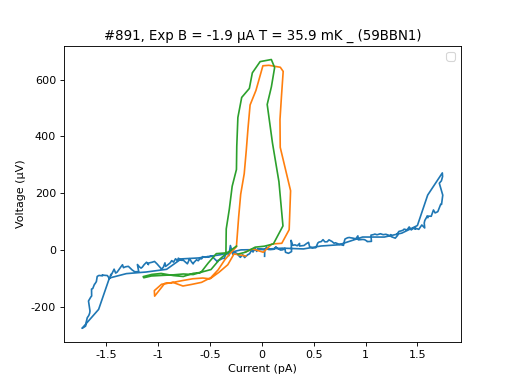

No handles with labels found to put in legend.


In [31]:
bpbi([723,886,891])

Ah, no, 723 corresponds to 300 mK, that's fine

## Large scale FF

avg 10

<IPython.core.display.Javascript object>


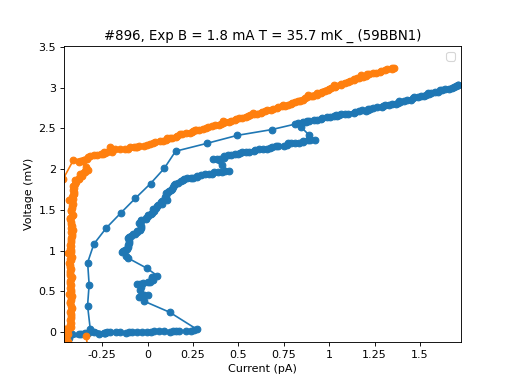

No handles with labels found to put in legend.


In [20]:
bpbi([895, 896], marker = 'o')

<IPython.core.display.Javascript object>


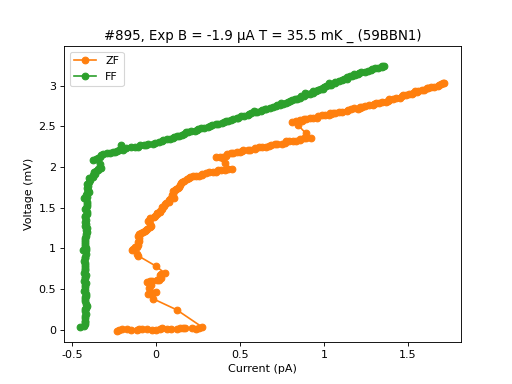

In [115]:
fig, ax = plt.subplots()

pbi(895, axes = ax)

l = ax.lines


l[0].remove()
lab = ['ZF', 'FF']

for i, idx in enumerate([ 895, 896]):

    I, V = xy_by_id(idx)

    I1, I2 = np.array_split(I,2)
    V1, V2 = np.array_split(V,2)

    ax.plot(I1[:-14], V1[:-14], 'o-', label = lab[i])
    
    
ax.legend()

avg 1

<IPython.core.display.Javascript object>


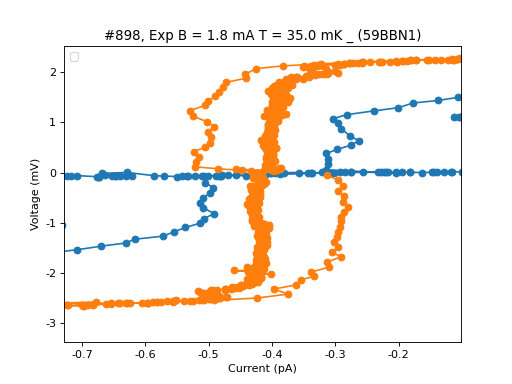

No handles with labels found to put in legend.


In [11]:
bpbi([897, 898], marker = 'o')

try again with avg 10!

<IPython.core.display.Javascript object>


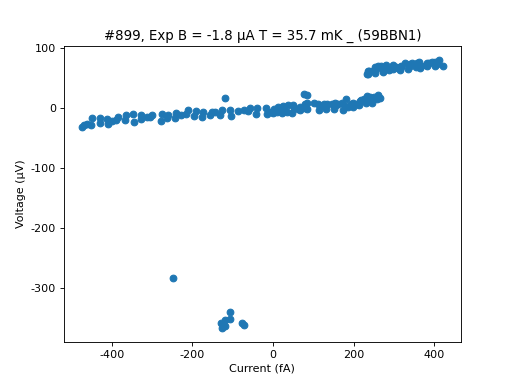

In [100]:
pbi(899)

<IPython.core.display.Javascript object>


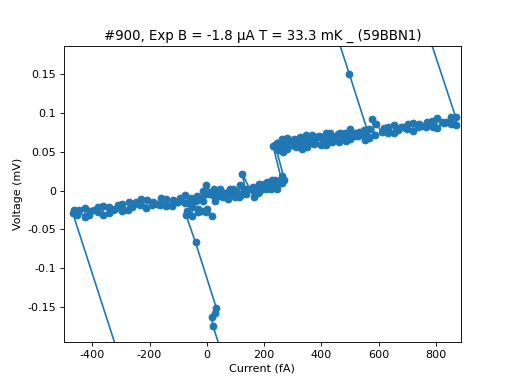

In [23]:
pbi(900, ls ='-')

<IPython.core.display.Javascript object>


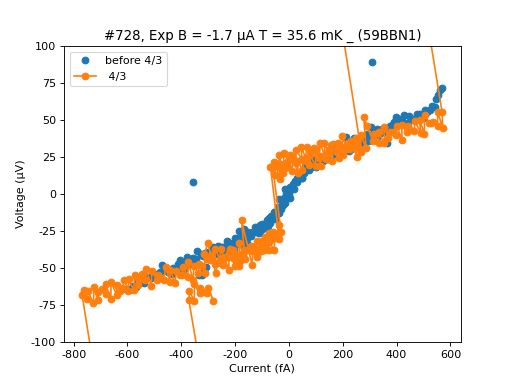

In [116]:
Ioff = .3e-12
Voff = 40e-6

ax = pbi(728, label = 'before 4/3')

I, V = xy_by_id(900)
ax.plot(I - Ioff, V - Voff, 'o-',label = ' 4/3')

ax.set_ylim(-100e-6, 100e-6)
ax.legend()

what is that? jump in sc branch instead of S shape?? why? depends on wiring? and this is not due to  gain drift

lets try avg 100


<IPython.core.display.Javascript object>


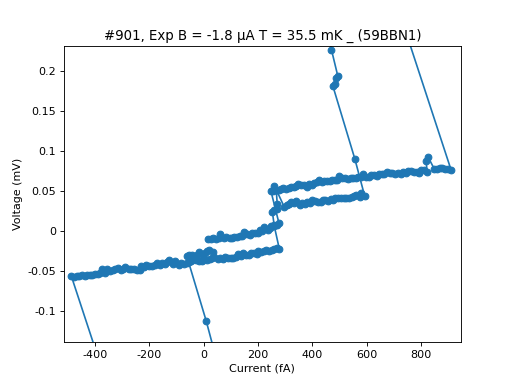

In [44]:
pbi(901, ls = '-')

<IPython.core.display.Javascript object>


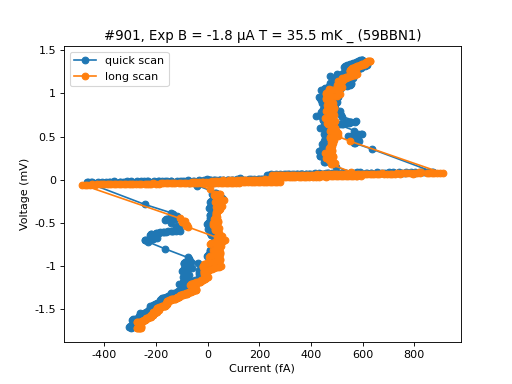

In [45]:
labs = ['quick scan', 'long scan']

bpbi([900, 901], marker = 'o', labels = labs)

50mk

<IPython.core.display.Javascript object>


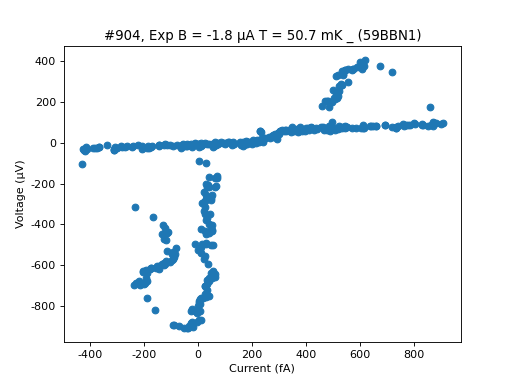

In [118]:
pbi(904)

<IPython.core.display.Javascript object>


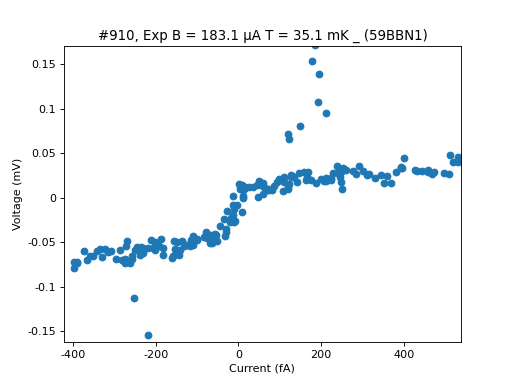

In [87]:
pbi(910)

<IPython.core.display.Javascript object>


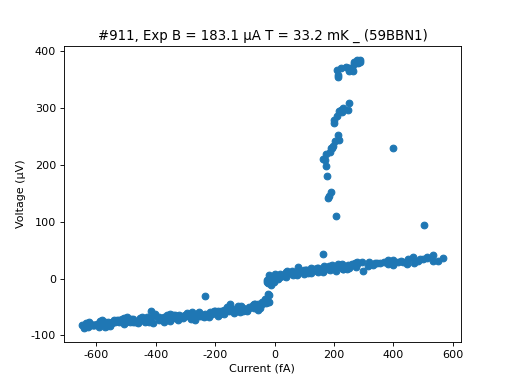

In [90]:
pbi(911)

## Finishing scan

<IPython.core.display.Javascript object>


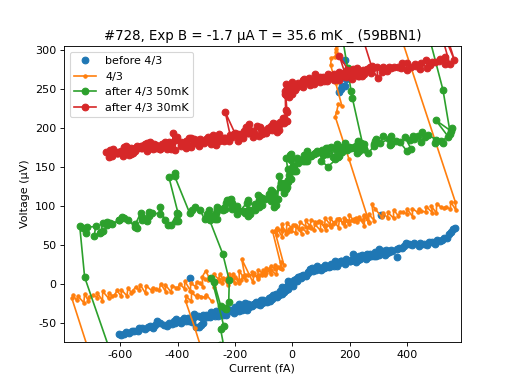

In [128]:
Ioff = .3e-12
Voff = -10e-6

ax = pbi(728, label = 'before 4/3')

I, V = xy_by_id(900)
ax.plot(I - Ioff, V - Voff, '.-',label = '4/3')

Ioff = .0e-12
Voff = -150e-6
I, V = xy_by_id(909)
ax.plot(I - Ioff, V - Voff, 'o-',label = 'after 4/3 50mK')

Ioff = .0e-12
Voff = -250e-6
I, V = xy_by_id(911)
ax.plot(I - Ioff, V - Voff, 'o-',label = 'after 4/3 30mK')



# Ioff = .30e-12
# Voff = 30e-6
# I, V = xy_by_id(912)
# ax.plot(I - Ioff, V - Voff, '.',label = '4/5 50mk')


# ax.set_ylim(-100e-6, 100e-6)
ax.legend()

<IPython.core.display.Javascript object>


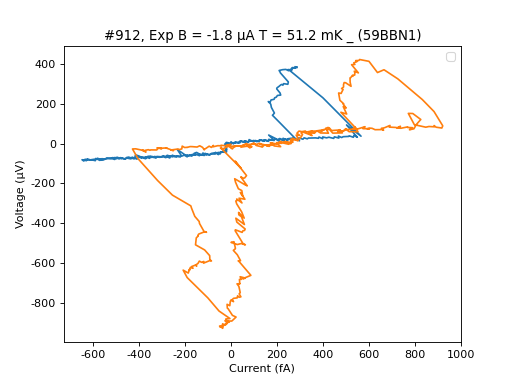

No handles with labels found to put in legend.


In [92]:
bpbi([911,912])

- 923 forgot to unshunt devices after restart LS370
- 924 unknown glitchy stuff
- 925 seems to be ok, check 926 for fine steps


<IPython.core.display.Javascript object>


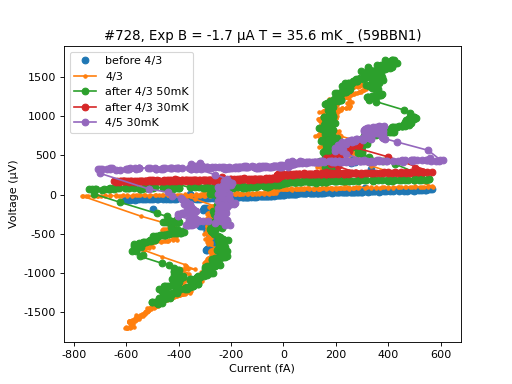

In [139]:
Ioff = .3e-12
Voff = -10e-6

ax = pbi(728, label = 'before 4/3')

I, V = xy_by_id(900)
ax.plot(I - Ioff, V - Voff, '.-',label = '4/3')

Ioff = .0e-12
Voff = -150e-6
I, V = xy_by_id(909)
ax.plot(I - Ioff, V - Voff, 'o-',label = 'after 4/3 50mK')

Ioff = .0e-12
Voff = -250e-6
I, V = xy_by_id(911)
ax.plot(I - Ioff, V - Voff, 'o-',label = 'after 4/3 30mK')

Ioff = .0e-12
Voff = -350e-6
I, V = xy_by_id(926)
ax.plot(I - Ioff, V - Voff, 'o-',label = '4/5 30mK')

ax.legend()

finishing up with:
- rough ZF/fine ZF&FF step scan for new biasing scheme
- rough ZF/fine ZF&FF step scan for old biasing scheme
- investigateing the zero biasing branch by assuming the system never cooled down to 35mK before

<IPython.core.display.Javascript object>


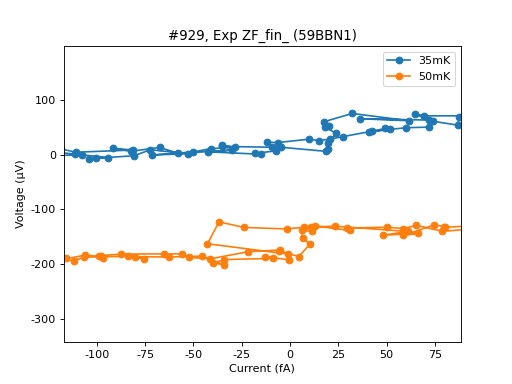

In [14]:
bpbi([926,929], labels=['35mK', '50mK'],marker ='o')

<IPython.core.display.Javascript object>


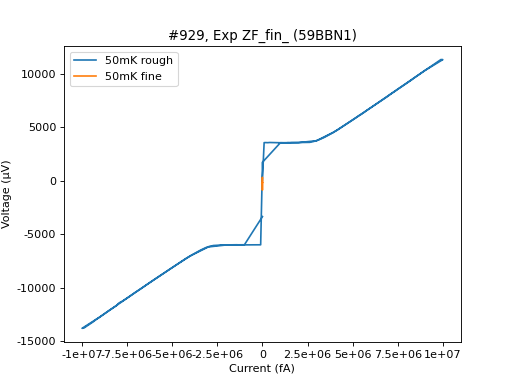

In [13]:
bpbi([927,929], labels=['50mK rough', '50mK fine'])

<IPython.core.display.Javascript object>


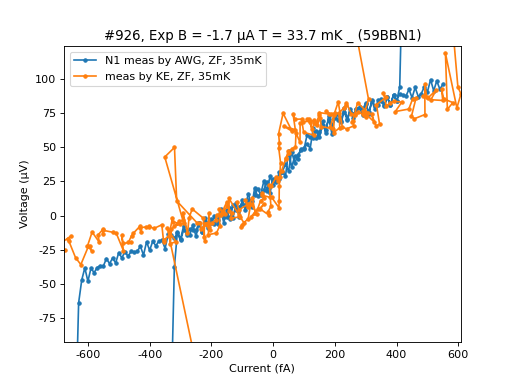

In [43]:
def dataread (filename, splitkw = '!DATASTR!'):
    with open(filename,'r') as file:
        rawtxt = file.read()
        splittxt = rawtxt.split(splitkw)    
    return(splittxt)

def filetoDFM (filename):
    datatxt = dataread(filename = filename)
    datastr = io.StringIO(datatxt[1])
    DataFM = pd.read_csv(datastr, sep = '\t')
    DataFM = DataFM.drop(DataFM.index[0])
    DataFM = DataFM.astype(float)
    return(DataFM, datatxt[0])

fpath = './LV data/'

f,ax=plt.subplots()

dataLV = filetoDFM(fpath + '200405-59BBN1_IVfZF-144508' + '.txt')
ax.plot(dataLV[0]['IS']+550e-15,
        dataLV[0]['V1']+125e-6, 
        label = 'N1 meas by AWG, ZF, 35mK', marker='.', ls='-')

bpbi( ids=[926], labels = ['meas by KE, ZF, 35mK'], ax = ax, marker='.', ls='-' )

ax.set_ylim(-800e-6,800e-6)
ax.set_xlim(-1000e-15,1000e-15)

ax.legend()

<IPython.core.display.Javascript object>


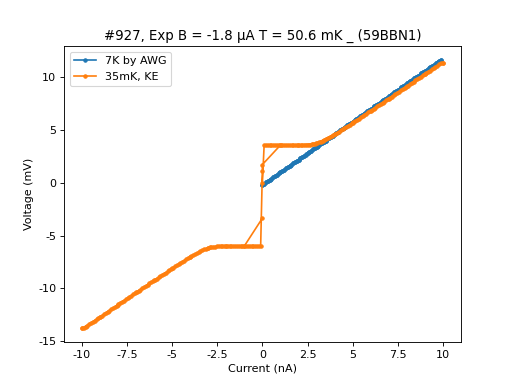

In [42]:
fpath = './LV data/'

f,ax=plt.subplots()

dataLV = filetoDFM(fpath + '200406-59BBN1_IVc7K-164311' + '.txt')
ax.plot(dataLV[0]['IS']+650e-15,
        dataLV[0]['V1'], 
        label = '7K by AWG', marker='.', ls='-')

bpbi( ids=[927], labels = ['35mK, KE'], ax = ax, marker='.', ls='-' )

ax.legend()

# ToDo

<IPython.core.display.Javascript object>


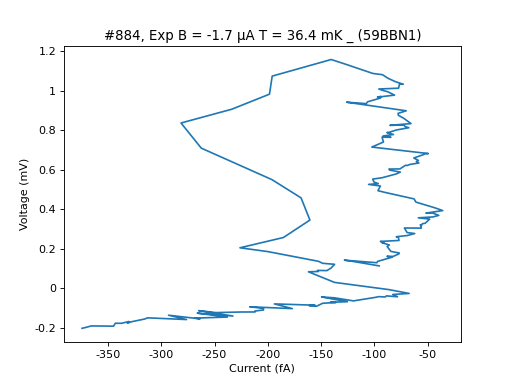

([<matplotlib.axes._subplots.AxesSubplot at 0x49de14d0>], [None])

In [687]:
pbi(884)

<IPython.core.display.Javascript object>


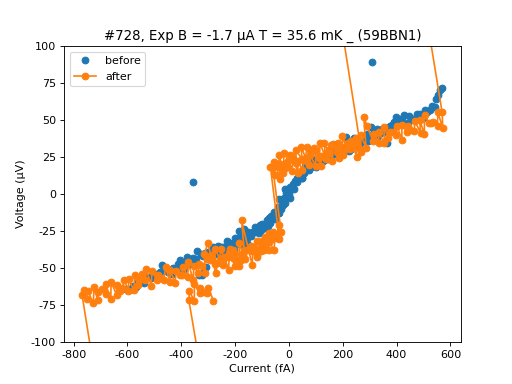

In [39]:
Ioff = .3e-12
Voff = 40e-6

ax = pbi(728, label = 'before 4/3')

I, V = xy_by_id(900)
ax.plot(I - Ioff, V - Voff, 'o-',label = 'after 4/3')

ax.set_ylim(-100e-6, 100e-6)
ax.legend()

TODO:
- measure real current throu the sample (meas V on Rb)
    - 
- figure out which tfsstb is suffutient and why
- voltage noise ~ 100 uV when set fast 6, check?
    - It is real but didn't change by chaning any R's.
- try different Rsh Rb to reduce offset time?
    - Offset time doesn't seem to be improved by reducing R_b, 
    but delay time was dramatically improved 
    (1Gohm takes 7sec to be stable while 100Mohm response almost instantly)
- stabilize i = 0
    - This doesn't seem to be an issue now.
- Why the curve is not very repeatable (



In [549]:
1/(1.2e6/30/7e3)

0.175

# Report

In [542]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

## Overview IVC

<IPython.core.display.Javascript object>


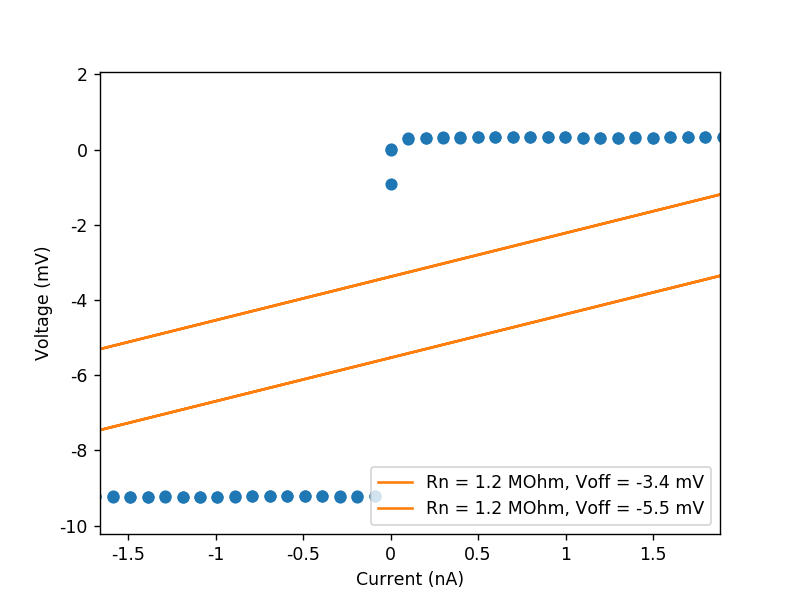

In [9]:
# idx = 12
idx= 858

ax = pbi(idx, lw = 5)

# ax = axs[0]
I,V = xy_by_id(idx)

Ifitp = I[50:100]
Vfitp = V[50:100]

Ifitm = I[-100:-50]
Vfitm = V[-100:-50]

Ifits = [Ifitp, Ifitm]
Vfits = [Vfitp, Vfitm]

for Ifit, Vfit in zip(Ifits, Vfits):


    z = np.polyfit(Ifit, Vfit, 1)

    Rn = z[0]
    Voff = z[1]
    ax.plot(I, I*Rn + Voff, c = 'C1', label = 'Rn = {}Ohm, Voff = {}V'.format(SI(Rn), SI(Voff)))
    ax.legend()


In [13]:
7/120

0.058333333333333334

In [453]:
1.6e-19/23e-6

6.956521739130434e-15

**Voff = 0.7 mV/30 = 23uV/squid**

## IVC fine scan

<IPython.core.display.Javascript object>


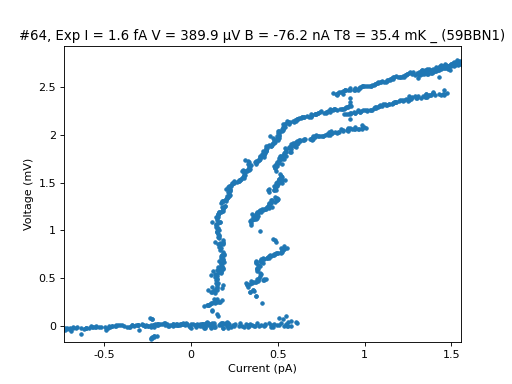

([<matplotlib.axes._subplots.AxesSubplot at 0x3d90abd0>], [None])

In [543]:
pbi(64, marker='.', ls = 'None')

<IPython.core.display.Javascript object>


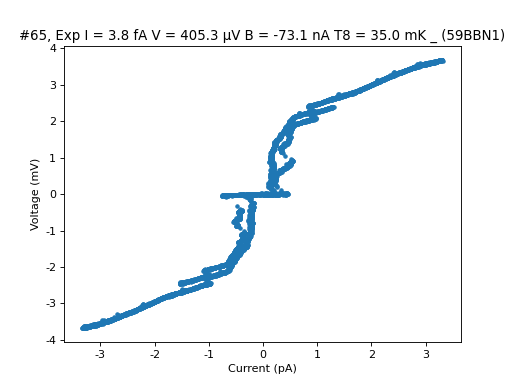

([<matplotlib.axes._subplots.AxesSubplot at 0x20b55950>], [None])

In [279]:
pbi(65, marker='.', ls = 'None')

## Extra avg  - visible subgap steps

<IPython.core.display.Javascript object>


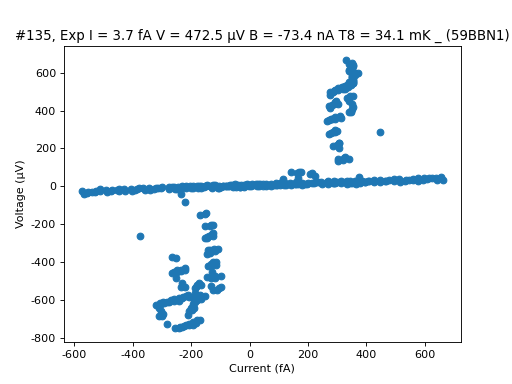

([<matplotlib.axes._subplots.AxesSubplot at 0x37df46b0>], [None])

In [470]:
pbi(135,  marker = 'o', ls = '')

**~70uV steps**

## B scan

In [551]:
Vth = 40e-6
B_list =    np.linspace(  0e-6,2e-3,51)
ids = range( 136,  186+1)
ids2 = range( 191,  241+1)
    
    


Isws, R0s = get_Isw_R0_by_id (ids, dy = 50e-6)
Isws2, R0s2 = get_Isw_R0_by_id (ids2, dy = 50e-6)


<IPython.core.display.Javascript object>


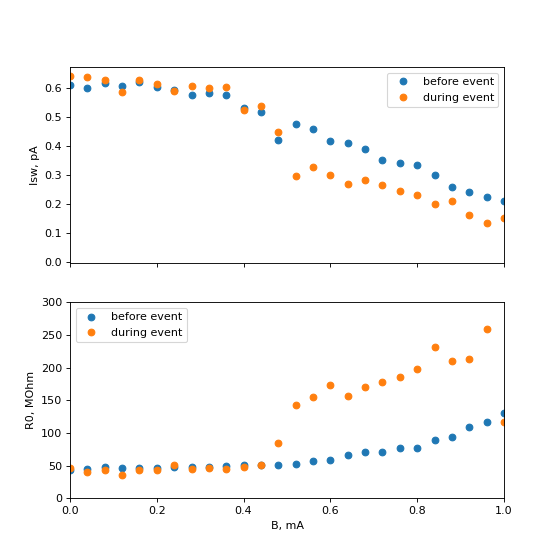

Text(0, 0.5, 'R0, MOhm')

In [512]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))

ax1.plot(B_list/1e-3, Isws /1e-12, 'o', label = 'before event') 
ax1.plot(B_list/1e-3, Isws2/1e-12, 'o', label = 'during event') 
ax1.legend()
ax1.set_xlim(0, 1)

ax1.set_ylabel('Isw, pA')



ax2.plot(B_list/1e-3, R0s /1e6, 'o', label = 'before event')  
ax2.plot(B_list/1e-3, R0s2/1e6, 'o', label = 'during event')
ax2.legend()
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 300)
ax2.set_xlabel('B, mA')
ax2.set_ylabel('R0, MOhm')

<IPython.core.display.Javascript object>


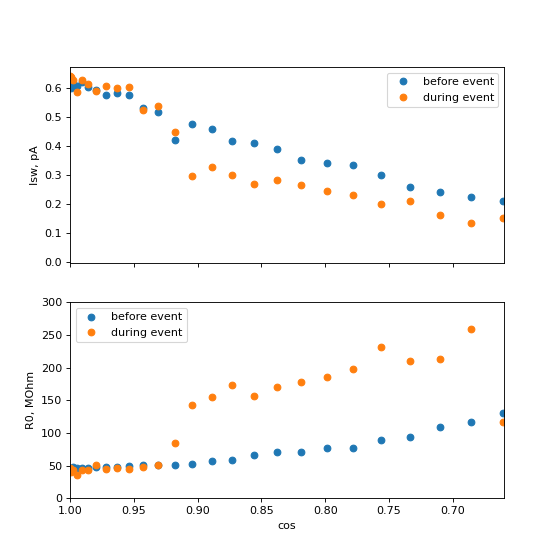

Text(0, 0.5, 'R0, MOhm')

In [552]:
cos = np.cos(B_list/1.85e-3*np.pi/2)


fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))

ax1.plot(cos, Isws /1e-12, 'o', label = 'before event') 
ax1.plot(cos, Isws2/1e-12, 'o', label = 'during event') 
ax1.legend()
ax1.set_xlim(1, 0.66)

ax1.set_ylabel('Isw, pA')



ax2.plot(cos, R0s /1e6, 'o', label = 'before event')  
ax2.plot(cos, R0s2/1e6, 'o', label = 'during event')
ax2.legend()
ax2.set_xlim(1, 0.66)
ax2.set_ylim(0, 300)
ax2.set_xlabel('cos')
ax2.set_ylabel('R0, MOhm')

## Example of jump in Ro

<IPython.core.display.Javascript object>


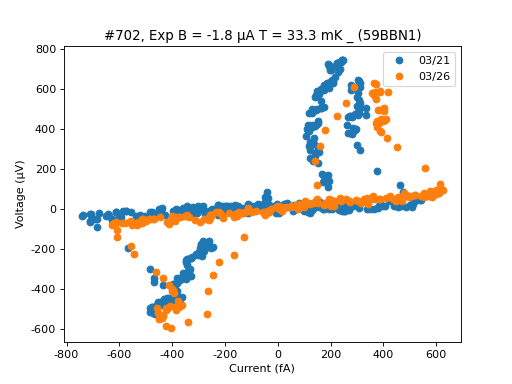

In [544]:
labs = '03/21' , '03/26'


bpbi([70, 702], labels = labs,  marker = 'o', ls = '')

<IPython.core.display.Javascript object>


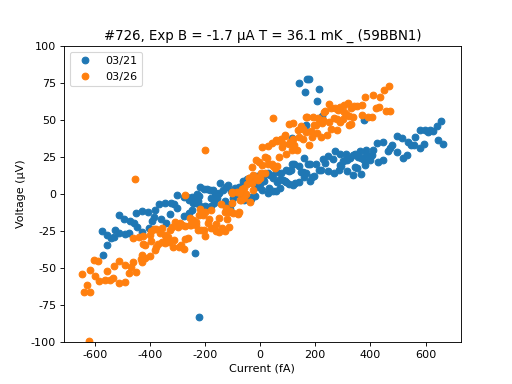

(array([6.18174386e-13, 5.79369869e-13]),
 array([5.59381265e+07, 1.23679768e+08]))

In [559]:
labs = '03/21' , '03/26'


ax = bpbi([135, 726], labels = labs,  marker = 'o', ls = '')



ax.set_ylim(-100e-6, 100e-6)

get_Isw_R0_by_id ([135, 728], dy = 70e-6)

### Navg = 100 

<IPython.core.display.Javascript object>


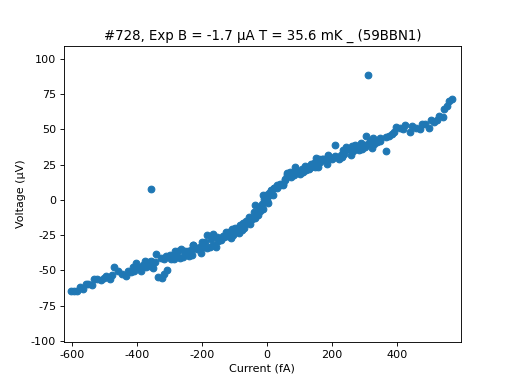

([<matplotlib.axes._subplots.AxesSubplot at 0x3afd5f90>], [None])

In [556]:
pbi(728, marker = 'o', ls = '')

## Full B scan after event

In [15]:

B_list =    np.linspace(  0e-6,2e-3,51)
ids = range( 294,  344+1)

Isws, R0s = get_Isw_R0_by_id (ids, dy = 70e-6)



<IPython.core.display.Javascript object>


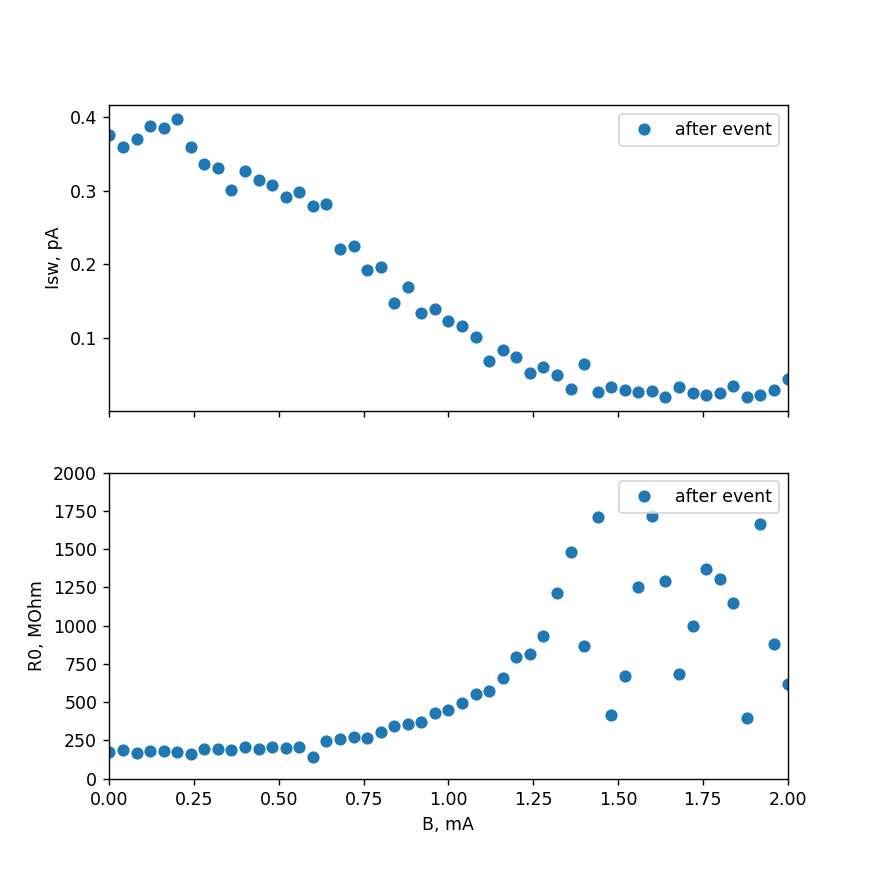

Text(0, 0.5, 'R0, MOhm')

In [16]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))

ax1.plot(B_list/1e-3, Isws /1e-12, 'o', label = 'after event') 

ax1.legend()
ax1.set_xlim(0, 2)

ax1.set_ylabel('Isw, pA')



ax2.plot(B_list/1e-3, R0s /1e6, 'o', label = 'after event')  

ax2.legend()
ax2.set_xlim(0, 2)
ax2.set_ylim(0, 2000)
ax2.set_xlabel('B, mA')
ax2.set_ylabel('R0, MOhm')

<IPython.core.display.Javascript object>


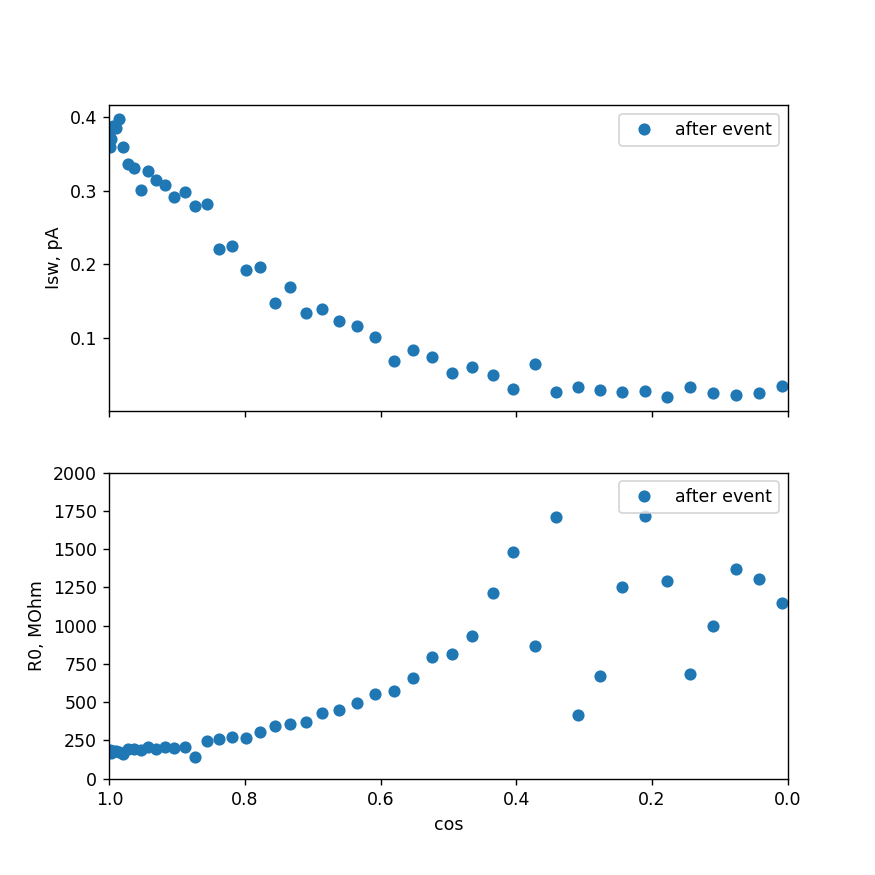

Text(0, 0.5, 'R0, MOhm')

In [17]:
cos = np.cos(B_list/1.85e-3*np.pi/2)


fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))

ax1.plot(cos, Isws /1e-12, 'o', label = 'after event') 
ax1.legend()
ax1.set_xlim(1, 0)
ax1.set_ylabel('Isw, pA')



ax2.plot(cos, R0s /1e6, 'o', label = 'after event')  
ax2.legend()
ax2.set_xlim(1, 0)
ax2.set_ylim(0, 2000)
ax2.set_xlabel('cos')
ax2.set_ylabel('R0, MOhm')

<IPython.core.display.Javascript object>


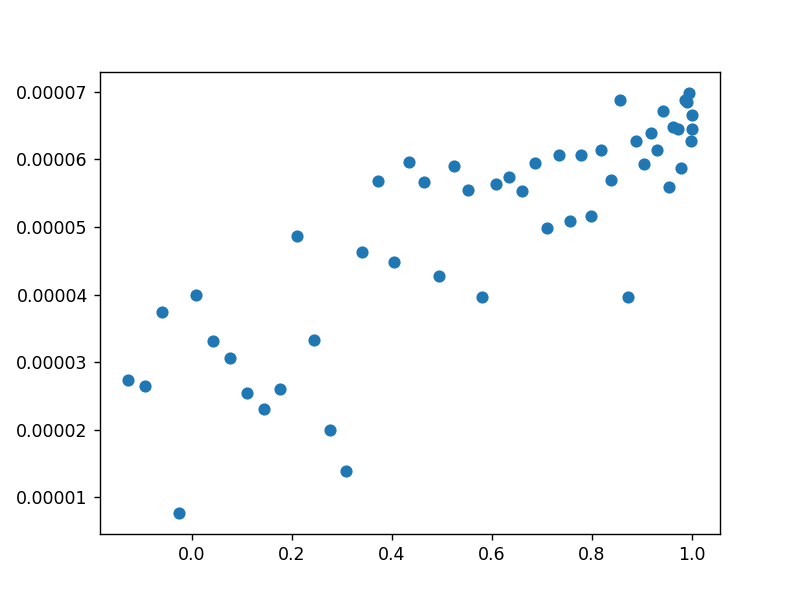

In [20]:
fig, ax = plt.subplots()

ax.plot(cos , R0s* Isws, 'o')

# ax.set_xscale('log')
# ax.set_yscale('log')

## B periodicity

In [516]:
B_list = udu_list ( 4e-3, 0.2e-3)
ids = range( 467,  549+1)

Isws, R0s = get_Isw_R0_by_id (ids, dy = 150e-6, Voff = 1.15e-3)

<IPython.core.display.Javascript object>


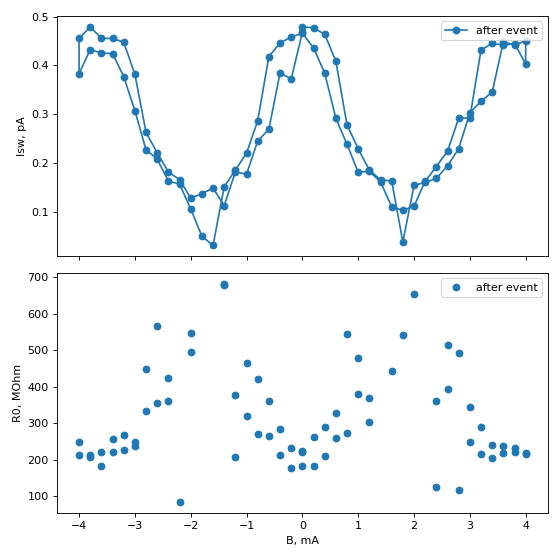

In [523]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))


ax1.plot(B_list/1e-3, Isws /1e-12, 'o-', label = 'after event') 
ax1.legend()
# ax1.set_xlim(0, 2)
ax1.set_ylabel('Isw, pA')



ax2.plot(B_list/1e-3, R0s /1e6, 'o', label = 'after event')  

ax2.legend()
# ax2.set_xlim(0, 2)
# ax2.set_ylim(0, 2000)
ax2.set_xlabel('B, mA')
ax2.set_ylabel('R0, MOhm')

plt.tight_layout()

## Tscan

### ZF, no correction

In [21]:
T_list = np.array( [50 + 25*i for i in range (11) ] )*1e-3
ids = [ 703 +i*2 for i in range(11) ]

Isws, R0s = get_Isw_R0_by_id (ids, dy = 150e-6, Voff = 0)

<IPython.core.display.Javascript object>


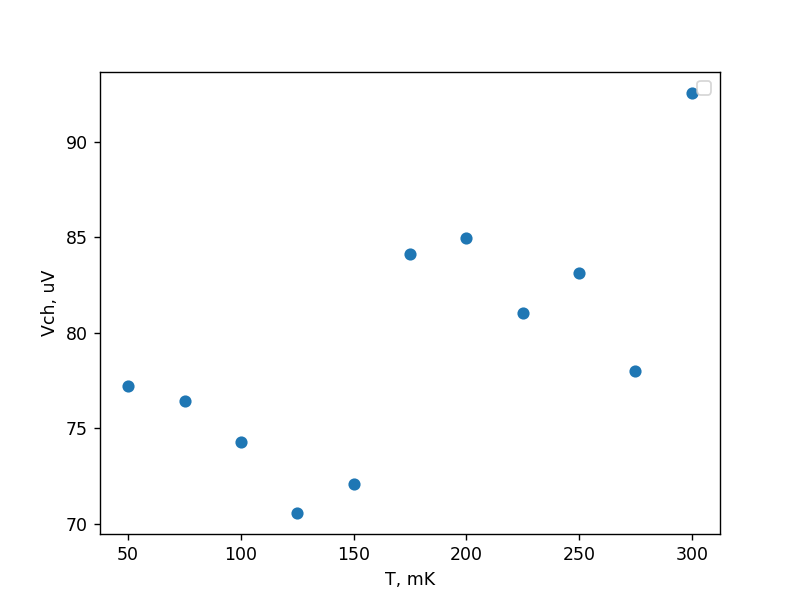

No handles with labels found to put in legend.


Text(0.5, 0, 'T, mK')

In [22]:
fig, ax1 = plt.subplots(  )



ax1.plot(T_list/1e-3, Isws*R0s/1e-6, 'o', label = '') 


ax1.legend()
# ax1.set_xlim(0, 2)

ax1.set_ylabel('Vch, uV')

ax1.set_xlabel('T, mK')


<IPython.core.display.Javascript object>


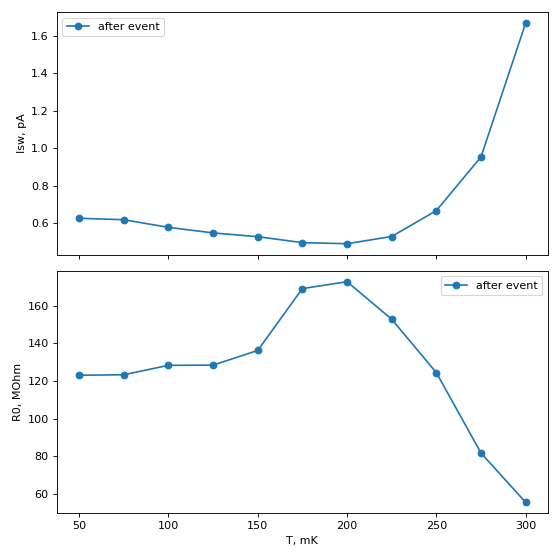

In [528]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))


ax1.plot(T_list/1e-3, Isws /1e-12, 'o-', label = 'after event') 
ax1.legend()
# ax1.set_xlim(0, 2)
ax1.set_ylabel('Isw, pA')



ax2.plot(T_list/1e-3, R0s /1e6, 'o-', label = 'after event')  

ax2.legend()
# ax2.set_xlim(0, 2)
# ax2.set_ylim(0, 2000)
ax2.set_xlabel('T, mK')
ax2.set_ylabel('R0, MOhm')

plt.tight_layout()

### FF, no correction

In [529]:
T_list = np.array( [50 + 25*i for i in range (11) ] )*1e-3
ids = [ 704 +i*2 for i in range(11) ]

Isws, R0s = get_Isw_R0_by_id (ids, dy = 150e-6, Voff = 0)

<IPython.core.display.Javascript object>


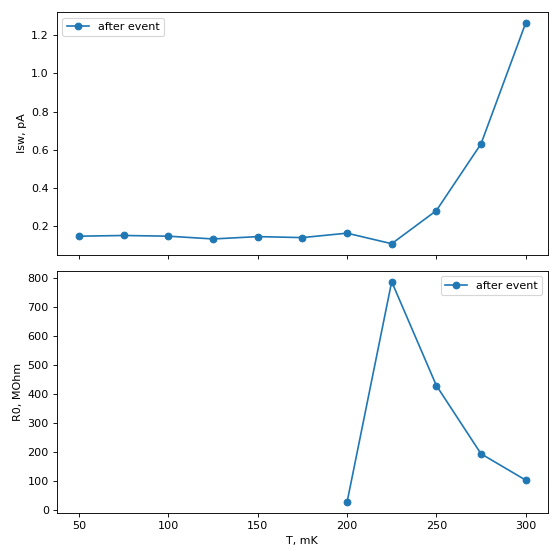

In [530]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))


ax1.plot(T_list/1e-3, Isws /1e-12, 'o-', label = 'after event') 
ax1.legend()
# ax1.set_xlim(0, 2)
ax1.set_ylabel('Isw, pA')



ax2.plot(T_list/1e-3, R0s /1e6, 'o-', label = 'after event')  

ax2.legend()
# ax2.set_xlim(0, 2)
# ax2.set_ylim(0, 2000)
ax2.set_xlabel('T, mK')
ax2.set_ylabel('R0, MOhm')

plt.tight_layout()

## ZF corrected by FF

<IPython.core.display.Javascript object>


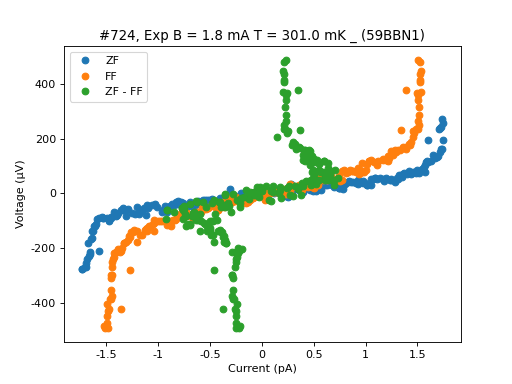

In [537]:
labs = 'ZF', 'FF'

ax = bpbi([723,724], marker = 'o', ls = '', labels = labs)

Izfs, Vzfs = xy_by_id(723 )
Iffs, Vffs = xy_by_id(724 )

izf = V_func(Vzfs, Izfs, Vffs )

ax.plot(izf - Iffs, Vffs, marker = 'o', ls = '', label = 'ZF - FF')
ax.legend()


<IPython.core.display.Javascript object>


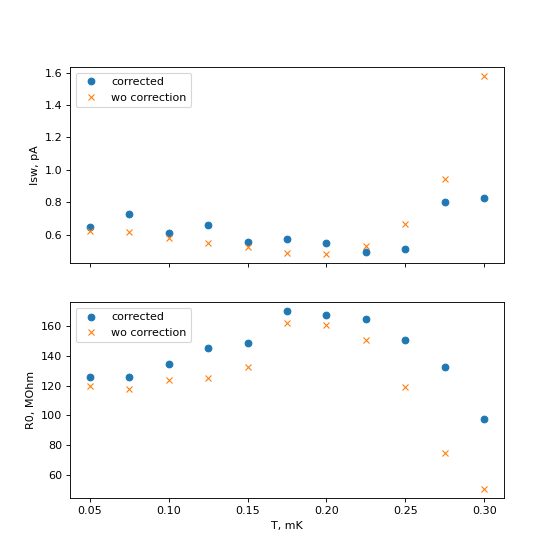

In [541]:
Vth = 100e-6
T_list = np.array( [50 + 25*i for i in range (11) ] )*1e-3

Isws = []
R0s = []

for i in range(11):
    
    Izfs, Vzfs = xy_by_id(703 +i*2)
    Iffs, Vffs = xy_by_id(704 +i*2)

    izf = V_func(Vzfs, Izfs, Vffs )
    
    Icp = izf - Iffs
    
    Isc = Icp  [abs(Vffs) < Vth]
    Vsc = Vffs [abs(Vffs) < Vth]
    
#     ax.plot(Isc, Vsc)
    
    Isw = (max(Isc) - min(Isc)) / 2
    Isws.append(Isw)
    z = np.polyfit(Isc, Vsc, 1)
    R0s.append(z[0])

R0s = np.array(R0s)    
Isws = np.array(Isws)    
    
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))   
    
ax1.plot(T_list, Isws/1e-12, 'o', label = 'corrected') 
ax1.set_ylabel('Isw, pA')

ax2.plot(T_list, R0s/1e6, 'o', label = 'corrected')  
ax2.set_xlabel('T, mK')
ax2.set_ylabel('R0, MOhm')


T_list = np.array( [50 + 25*i for i in range (11) ] )*1e-3
ids = [ 703 +i*2 for i in range(11) ]

Isws_wocorr, R0s_wocorr = get_Isw_R0_by_id (ids, dy = Vth, Voff = 0)

ax1.plot(T_list, Isws_wocorr/1e-12, 'x',label = 'wo correction' )
ax2.plot(T_list, R0s_wocorr/1e6, 'x'   ,label = 'wo correction') 


ax1.legend()
ax2.legend()

## B scan @ 200mK

In [664]:
ids = range( 752,  802+1)
B_list =    np.linspace(  0e-6,1.85e-3,51)[:len(ids)]

Isws, R0s = get_Isw_R0_by_id (ids, dy = 120e-6)

# B_list_bt =    np.linspace(  0e-6,2e-3,51)
# ids = range( 294,  344+1)

ids = range( 803,  853+1)
B_list_bt =   np.linspace(  0e-6,1.85e-3,51)[:len(ids)]
Isws_bt, R0s_bt = get_Isw_R0_by_id (ids, dy = 120e-6)


In [624]:
6/4.5

1.3333333333333333

<IPython.core.display.Javascript object>


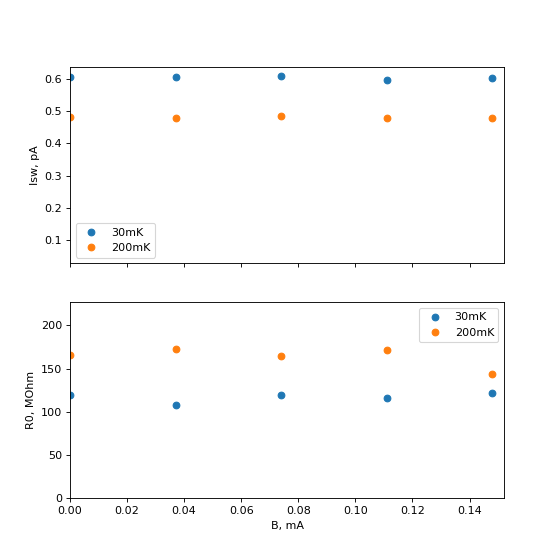

Text(0, 0.5, 'R0, MOhm')

In [665]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))


ax1.plot(B_list_bt/1e-3, Isws_bt /1e-12, 'o', label = '30mK') 
ax1.plot(B_list/1e-3, Isws /1e-12, 'o', label = '200mK') 


ax1.legend()
ax1.set_xlim(0, 2)

ax1.set_ylabel('Isw, pA')



  
ax2.plot(B_list_bt/1e-3, R0s_bt /1e6, 'o', label = '30mK')
ax2.plot(B_list/1e-3, R0s /1e6, 'o', label = '200mK')


ax2.legend()
ax2.set_xlim(0, 2)
ax2.set_ylim(0, 1000)


ax2.set_xlabel('B, mA')
ax2.set_ylabel('R0, MOhm')

<IPython.core.display.Javascript object>


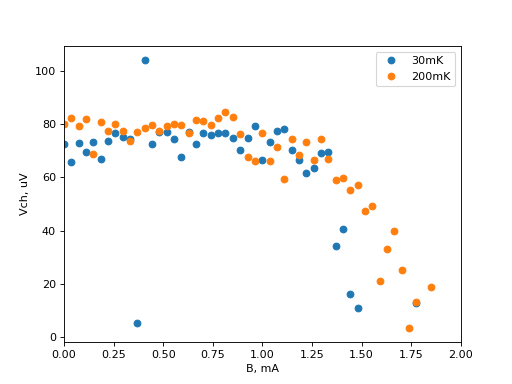

Text(0.5, 0, 'B, mA')

In [633]:
fig, ax1 = plt.subplots(  )


ax1.plot(B_list_bt/1e-3, Isws_bt*R0s_bt/1e-6, 'o', label = '30mK') 
ax1.plot(B_list/1e-3, Isws*R0s/1e-6, 'o', label = '200mK') 


ax1.legend()
ax1.set_xlim(0, 2)

ax1.set_ylabel('Vch, uV')

ax1.set_xlabel('B, mA')





<IPython.core.display.Javascript object>


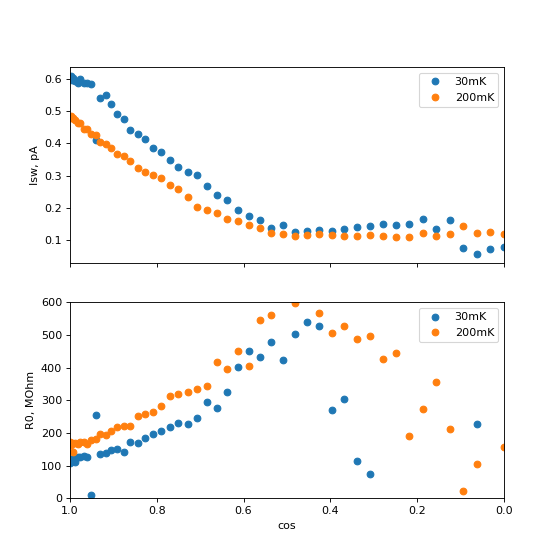

Text(0, 0.5, 'R0, MOhm')

In [619]:
cos = np.cos(B_list/1.85e-3*np.pi/2)
cos_bt = np.cos(B_list_bt/1.85e-3*np.pi/2)

fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = (7,7))

ax1.plot(cos_bt, Isws_bt /1e-12, 'o', label = '30mK') 
ax1.plot(cos, Isws /1e-12, 'o', label = '200mK') 


ax1.legend()
ax1.set_xlim(1, 0)

ax1.set_ylabel('Isw, pA')



  
ax2.plot(cos_bt, R0s_bt /1e6, 'o', label = '30mK')
ax2.plot(cos, R0s /1e6, 'o', label = '200mK')


ax2.legend()
ax2.set_xlim(1, 0)
ax2.set_ylim(0, 600)


ax2.set_xlabel('cos')
ax2.set_ylabel('R0, MOhm')

### Navg = 100 

<IPython.core.display.Javascript object>


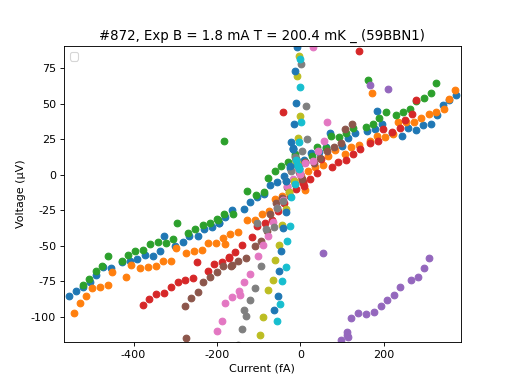

No handles with labels found to put in legend.


In [20]:
labs = '30mK', '200mK', '200mK cos = 0.6'

bpbi(range(862, 872+1), marker = 'o', ls = '')

In [670]:
get_Isw_R0_by_id([728,861, 865], dy = 100e-6)

(array([5.87419957e-13, 4.69065828e-13, 3.27718359e-13]),
 array([1.24594736e+08, 1.49779116e+08, 2.27035703e+08]))

In [667]:
20e-3/50e-15/1e9

400.0

I'm not sure why, but even this device seems to be very sensitive to the connection. 886-888 follows the same connection as in 723 before, but now looks different. Need come to lab to double check.*

<IPython.core.display.Javascript object>


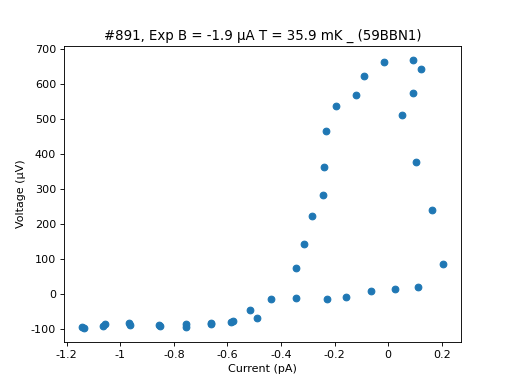

([<matplotlib.axes._subplots.AxesSubplot at 0xc5bf270>], [None])

In [29]:
pbi(891, marker = 'o', ls = '')